# Analysis of Mixed Layer Variability in RFR Outputs

## PART 0: Import packages and data

In [1]:
# Import Packages

#Data Structure/Organization Packages
import pandas as pd
import xarray as xr
import numpy as np
import numpy.ma as ma

# Plotting Packages
import matplotlib.pyplot as plt
from cmocean import cm as cmo
import seaborn as sns
import matplotlib.patches as patch
from labellines import labelLine, labelLines
from matplotlib.ticker import FormatStrFormatter
import matplotlib.patheffects as pe 

# Utility Packages
import random as rand
import os
import math
# import dataframe_image as dfi
import itertools
from scipy import interpolate
from tqdm import tqdm


import importlib
from importlib import reload

# Modules
import mod_main as sg
import mod_L3proc as gproc     # for L3 grid processing
import mod_DFproc as dfproc    # for dataframe processing
import mod_plot as sgplot  
from mod_plot import my_params


<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ndarray size changed, may indicate binary incompatibility. Expected 16 from C header, got 96 from PyObject


In [12]:
import mod_MLV as mlv 

In [2]:
from mod_main import floatDF, shipDF
from mod_main import df_659, df_660, dav_659, dav_660
from mod_main import sgfloat, dav_float # sogos float (yd<205)
from mod_main import dav_6030 # long mld series for 5906030

from mod_RFR import mltraining, mlvalidation, mltest
from mod_RFR import var_list, model_list

from mod_RFR import RF_pred_6030, ESPER_pred, CANYON_pred
# from mod_RFR import RF_validation,
# from mod_MLV import mlstat_659, 

In [3]:
# Download fronts
dir = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/'
PF = pd.read_csv(dir + 'ACC_fronts_Jade/PF.csv', header=None)
SAF = pd.read_csv(dir + 'ACC_fronts_Jade/SAF.csv', header=None)
SIF = pd.read_csv(dir + 'ACC_fronts_Jade/SIF.csv', header=None)
STF = pd.read_csv(dir + 'ACC_fronts_Jade/STF.csv', header=None)

for curr in [PF, SIF]:
    curr.columns = ['lon', 'lat']

In [4]:
plt.rcParams.update(my_params(14))

# PART 1: Glider MLD, DAV (Dive-Averaged)

In [5]:
# Use dataset before dropping NaNs on unrelated BGC variables.
# Note we use "sg659" which has not-QC values for nitrate/oxygen, to calculate MLD
# Other analyses should use df_659, which has been QC dropped
sg659 = pd.read_csv('../data/glider/df_659_tsO2corr_nonandrop_0131.csv')
sg660 = pd.read_csv('../data/glider/df_660_tsO2corr_nonandrop_0131.csv')


In [96]:
dav_659, nanmld_659 = dfproc.make_diveav(sg659[sg659.yearday>0], thresh=0.005, mld_lim=[8,12]); print() 
dav_660, nanmld_660 = dfproc.make_diveav(sg660[sg660.yearday>0], thresh=0.005, mld_lim=[8,12])

/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/RandomForest_SG/scripts/mod_DFproc.py:163: RuntimeWarning: Mean of empty slice
  dens10m = np.nanmean(temp10.sigma0.values)


number of profiles with no 10m data:  0
approx # of obs within profile that were averaged for final mlp:  4.270833333333333
number of nan mlds even where 10m exists:  82



/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/RandomForest_SG/scripts/mod_DFproc.py:163: RuntimeWarning: Mean of empty slice
  dens10m = np.nanmean(temp10.sigma0.values)


number of profiles with no 10m data:  0
approx # of obs within profile that were averaged for final mlp:  5.4375
number of nan mlds even where 10m exists:  98


In [ ]:
# dav_659.to_csv('../data/glider/dav_659_may24.csv', index=False)
# dav_660.to_csv('../data/glider/dav_660_may24.csv', index=False)

# dav_659 = pd.read_csv('../data/glider/dav_659_may24.csv')  
# dav_660 = pd.read_csv('../data/glider/dav_660_may24.csv')

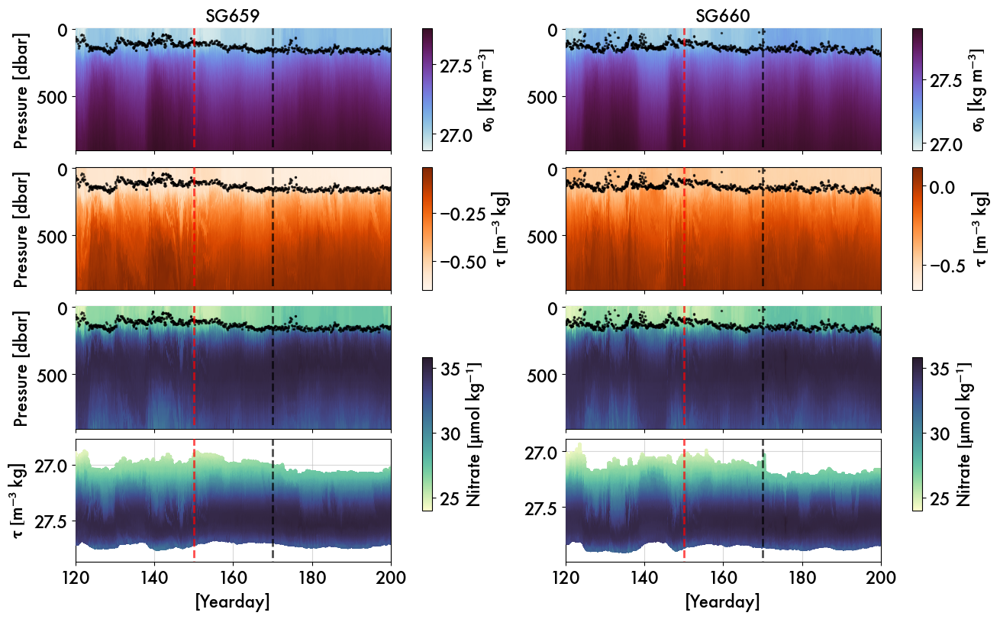

(<Figure size 1300x800 with 14 Axes>,
 array([[<AxesSubplot: title={'center': 'SG659'}, ylabel='Pressure [dbar]'>,
         <AxesSubplot: title={'center': 'SG660'}>],
        [<AxesSubplot: ylabel='Pressure [dbar]'>, <AxesSubplot: >],
        [<AxesSubplot: ylabel='Pressure [dbar]'>, <AxesSubplot: >],
        [<AxesSubplot: xlabel='[Yearday]', ylabel='$ \\mathbf{\\tau} $ $\\mathbf{[m^{-3}~}$kg]'>,
         <AxesSubplot: xlabel='[Yearday]'>]], dtype=object))

In [65]:
# Copied from Training_RandomForest and Analysis_Plots
reload(sgplot)
sgplot.plt_glider_sections(preslim=900, fsize=(13,8), vlist = ['sigma0', 'spice', 'nitrate_G'], 
                           font = 16, dateformat=False);

## 2.1 Add EKE to dive-averaged

In [107]:
# Use correct delayed-time product
altimetry = xr.open_dataset('../data/satellite/cmems_obs-sl_glo_phy-ssh_my_allsat-l4-duacs-0.25deg_P1D_1714604183615.nc')
altimetry['eke'] = np.sqrt(altimetry.ugosa**2 + altimetry.vgosa**2) /2 
datestart='2019-04-30'
dateend='2019-07-25'
dateend='2021-07-25'
lat1=-56.8; lat2=-43
lon1=19; lon2=41
data_sat = altimetry.sel(time=slice(datestart, dateend))
data_sat = data_sat.sel(latitude=slice(lat1, lat2))
data_sat = data_sat.sel(longitude=slice(lon1, lon2))

# Calculate EKE for each glider. EKE averaged daily.
dav_659['eke'] = dfproc.get_track_eke(dav_659, data_sat, daily=True)
dav_660['eke']= dfproc.get_track_eke(dav_660, data_sat, daily=True)

# EKE, using averaging over whole deployment
dav_659['eke_avg'] = dfproc.get_track_eke(dav_659, data_sat, daily=False)
dav_660['eke_avg']= dfproc.get_track_eke(dav_660, data_sat, daily=False)


## 2.2 Add daily PAR to dive-averaged datasets

In [ ]:
# Download data
modis = xr.open_dataset('../data/satellite/Aqua.L3m_8D_2019_par_4km.nc')
modis['days'] = sg.datetime2ytd(modis.time)

# Trim MODIS to speed up method
lat1 = -57
lat2 = -48
lon1 = 10
lon2 = 70

modis = modis.sel(lat=slice(lat1, lat2))
modis = modis.sel(lon=slice(lon1, lon2))
modis = modis.sel(time=slice('2019-04-15', '2019-08-05'))

In [ ]:
# Add PAR
def get_closest_par(row):
    lat = row.lat
    lon = row.lon
    time = sg.ytd2datetime(row.yearday)

    row['par'] = modis.sel(time=time, lat=lat, lon=lon, method='nearest').par.values
    return row

dav_660['par'] = np.tile(np.nan, dav_660.shape[0])
dav_659['par'] = np.tile(np.nan, dav_659.shape[0])

dav_659 = dav_659.apply(get_closest_par, axis='columns')
dav_660 = dav_660.apply(get_closest_par, axis='columns')

dav_660.profid = dav_660.profid.astype(int)  # apply function will cast into float
dav_659.profid = dav_659.profid.astype(int)

# dav_659.to_csv('../data/glider/dav_659_EKEPAR.csv')  
# dav_660.to_csv('../data/glider/dav_660_EKEPAR.csv')



# PART 2: Glider MLSTAT (Integrated, Variance)

In [10]:
# Since we know we're using Model G, rename:
df_659.rename(columns={'nitrate_G':'nitrate'}, inplace=True)
df_660.rename(columns={'nitrate_G':'nitrate'}, inplace=True)

## 2.1 Integrate over MLD to find mean mixed layer value.

In [14]:
# Make ML dataframes
reload(mlv)
mldf_659 = mlv.make_mldf(df_659, dav_659)
mldf_660 = mlv.make_mldf(df_660, dav_660)

# Turn dav dataframes into ml stats
mlstat_659 = mlv.add_ML_integrated(mldf_659, dav_659, variable='nitrate')
mlstat_659 = mlv.add_ML_integrated(mldf_659, mlstat_659, variable='bbp470')
mlstat_659 = mlv.add_ML_integrated(mldf_659, mlstat_659, variable='oxygen')

mlstat_660 = mlv.add_ML_integrated(mldf_660, dav_660, variable='nitrate')
mlstat_660 = mlv.add_ML_integrated(mldf_660, mlstat_660, variable='bbp470')
mlstat_660 = mlv.add_ML_integrated(mldf_660, mlstat_660, variable='oxygen')

In [16]:
reload(mlv)
mlstat_660 = mlv.add_crossML_grad(df_660, mlstat_660, bounds = [10,30])
mlstat_659 = mlv.add_crossML_grad(df_659, mlstat_659, bounds = [10,30])

# reason we didn't get all nitrate cross values is because we are missing some nitrate obs

905 out of 1008 profiles
828 out of 912 profiles


## 2.2 Horizontal Buoyancy Gradients

- https://agupubs-onlinelibrary-wiley-com.offcampus.lib.washington.edu/doi/10.1029/2021JC018045 

Updated Jun 04 2024

In [17]:
# Calculate horizontal buoyancy gradients for each 
reload(mlv)
bx_659 = mlv.get_ml_bx(df_659, dav_659, rho_ref = np.nanmean(df_659.sigma0) + 1000)
bx_660 = mlv.get_ml_bx(df_660, dav_660, rho_ref = np.nanmean(df_660.sigma0) + 1000)

/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/RandomForest_SG/scripts/mod_MLV.py:242: RuntimeWarning: Mean of empty slice


## 2.3 Buoyancy at base of ML

In [34]:
baseML_stat659 = mlv.get_baseML_stat(mldf_659, dav_659)
baseML_stat660 = mlv.get_baseML_stat(mldf_660, dav_660)
baseML_float = mlv.get_baseML_stat(mldf_float, dav_float)

## 2.4 Add new variables to mlstat variable

In [85]:
for ind, profnum in enumerate(mlstat_659.profid.values):
    if profnum in bx_659.profid.values:
        mlstat_659.at[ind, 'b'] = bx_659[bx_659.profid==profnum].b.values[0]
        mlstat_659.at[ind, 'bx'] = bx_659[bx_659.profid==profnum].bx.values[0]
for ind, profnum in enumerate(mlstat_660.profid.values):
    if profnum in bx_660.profid.values:
        mlstat_660.at[ind, 'b'] = bx_660[bx_660.profid==profnum].b.values[0]
        mlstat_660.at[ind, 'bx'] = bx_660[bx_660.profid==profnum].bx.values[0]

mlstat_659 = mlstat_659[['profid', 'yearday', 'lat', 'lon', 'mld', 'par',
       'nitrate_total', 'nitrate_mean', 'bbp470_total', 'bbp470_mean',
       'oxygen_total', 'oxygen_mean', 'nitrate_cross', 'nitrate_underML',
       'log_buoyancy', 'b', 'bx']]

mlstat_660 = mlstat_660[['profid', 'yearday', 'lat', 'lon', 'mld', 'par',
       'nitrate_total', 'nitrate_mean', 'bbp470_total', 'bbp470_mean',
       'oxygen_total', 'oxygen_mean', 'nitrate_cross', 'nitrate_underML',
       'log_buoyancy', 'b', 'bx']]

mlstat_659['xdist'] = np.tile(0, len(dav_659))
mlstat_659.loc[1:, 'xdist'] = mlv.dist_between_profiles(dav_659)

mlstat_660['xdist'] = np.tile(0, len(dav_660))
mlstat_660.loc[1:, 'xdist'] = mlv.dist_between_profiles(dav_660)

/var/folders/nt/sjynqxjj7cz9r15fkd5d4r_40000gn/T/ipykernel_28552/2728274734.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mlstat_659['xdist'] = np.tile(0, len(dav_659))


In [77]:
# If saving for the first time: 
# mlstat_659.to_csv('../working-vars/ML-variability/mixedlayerstat_659_may24.csv')
# mlstat_660.to_csv('../working-vars/ML-variability/mixedlayerstat_660_may24.csv')

# hvariance_660.to_csv('../working-vars/ML-variability/hvariance_660_may24.csv')
# hvariance_659.to_csv('../working-vars/ML-variability/hvariance_659_may24.csv')

# PART 3: Float MLD, DAV, MLSTAT

In [99]:
from mod_main import sgfloat
from mod_main import dav_float  # if re-running

We have two datasets for the float:
- `mld_float` : mld for all the float profiles
- `dav_float` : without profile 002, which is missing nitrate data

Note that yearday 130 has valid MLD valculation, but bad nitrate data. 
We use `mld_float` when plotting mixed layer depth across platforms.
For other nitrate fields (e.g. mean ML nitrate), use `dav_float`. 


In [128]:
# Version of feb 2024
# Use non QC float data to calculate MLD before using nitrate data from filtered floatDF
noQC_float = pd.read_csv('../data/bgc-argo/complete_sgfloat_noQC.csv', index_col=0)
mld_float, blank = dfproc.make_diveav(noQC_float, thresh=0.025, mld_lim=[5,15])
mld_float

number of profiles with no 10m data:  0
approx # of obs within profile that were averaged for final mlp:  19.11764705882353
number of nan mlds even where 10m exists:  0


,profid,yearday,lat,lon,mld
0,5906030000,120.374294,-51.355,30.208,110.387143
1,5906030001,125.159699,-51.074,32.828,99.488429
2,5906030002,130.068877,-51.796,31.632,89.316154
3,5906030003,135.173252,-52.452,31.764,84.632142
4,5906030004,140.063449,-51.856,33.445,72.162813
5,5906030005,145.180833,-51.417,34.669,77.281667
6,5906030006,150.053704,-51.576,35.332,102.539999
7,5906030007,155.181458,-52.204,35.413,113.833890
8,5906030008,160.070995,-52.743,34.407,124.864286
9,5906030009,165.173206,-53.360,35.171,158.961667


In [129]:
# Add along-track EKE
dav_float = mld_float.copy()
dav_float['eke'] = dfproc.get_track_eke(dav_float, data_sat, daily=True)
dav_float['eke_avg'] = dfproc.get_track_eke(dav_float, data_sat, daily=False)

# Add float PAR
dav_float['par'] = np.tile(np.nan, dav_float.shape[0])
dav_float = dav_float.apply(get_closest_par, axis='columns')  #get_closest_par is defined above
dav_float.profid = dav_float.profid.astype(int)

In [130]:
dav_float

,profid,yearday,lat,lon,mld,eke,eke_avg,par
0,5906030000,120.374294,-51.355,30.208,110.387143,0.269304,0.206646,5.399998
1,5906030001,125.159699,-51.074,32.828,99.488429,0.106413,0.156344,6.285995
2,5906030002,130.068877,-51.796,31.632,89.316154,0.281414,0.168284,5.573997
3,5906030003,135.173252,-52.452,31.764,84.632142,0.143469,0.148048,5.705997
4,5906030004,140.063449,-51.856,33.445,72.162813,0.188929,0.191132,4.339996
5,5906030005,145.180833,-51.417,34.669,77.281667,0.101493,0.143186,4.687996
6,5906030006,150.053704,-51.576,35.332,102.539999,0.044460,0.088376,5.845997
7,5906030007,155.181458,-52.204,35.413,113.833890,0.185974,0.097617,3.587997
8,5906030008,160.070995,-52.743,34.407,124.864286,0.141653,0.143261,4.221996
9,5906030009,165.173206,-53.360,35.171,158.961667,0.190020,0.117461,2.579998


### Next, get MLSTATS. 

- For this, we need to take out profile 002. 

In [123]:
# Take out profile 002 since it did not have valid nitrate data. 
sgfloat = floatDF[floatDF.wmoid==5906030]
sgfloat = sgfloat[sgfloat.yearday<210]
mldf_float = mlv.make_mldf(sgfloat, dav_float[dav_float.profid != 5906030002])

In [133]:
# Add mixed layer statistics as for the gliders. 
# Note resolution is not high enough to calculate the horizontal buoyancy gradient

mlstat_float = mlv.add_ML_integrated(mldf_float, dav_float[dav_float.profid != 5906030002], variable='nitrate')
mlstat_float = mlv.add_ML_integrated(mldf_float, mlstat_float, variable='oxygen')
mlstat_float = mlv.add_crossML_grad(sgfloat, mlstat_float, bounds = [10,30])

# mlstat_float.to_csv('../working-vars/ML-variability/mixedlayerstat_float_may24.csv')


16 out of 16 profiles


In [134]:
mlstat_float

,profid,yearday,lat,lon,mld,eke,eke_avg,par,nitrate_total,nitrate_mean,oxygen_total,oxygen_mean,nitrate_cross,nitrate_underML
0,5906030000,120.374294,-51.355,30.208,110.387143,0.269304,0.206646,5.399998,2.742968e+06,24.848618,3.672361e+07,332.680175,-0.905262,25.753880
1,5906030001,125.159699,-51.074,32.828,99.488429,0.106413,0.156344,6.285995,2.694141e+06,27.079946,3.350537e+07,336.776537,-0.130993,27.210939
2,5906030003,135.173252,-52.452,31.764,84.632142,0.143469,0.148048,5.705997,2.261248e+06,26.718547,2.829175e+07,334.290793,-0.725808,27.444356
3,5906030004,140.063449,-51.856,33.445,72.162813,0.188929,0.191132,4.339996,1.891412e+06,26.210349,2.402937e+07,332.988241,-0.856674,27.067023
4,5906030005,145.180833,-51.417,34.669,77.281667,0.101493,0.143186,4.687996,1.957742e+06,25.332552,2.548536e+07,329.772418,-1.562108,26.894660
5,5906030006,150.053704,-51.576,35.332,102.539999,0.044460,0.088376,5.845997,2.774597e+06,27.058684,3.407846e+07,332.343072,-1.909547,28.968231
6,5906030007,155.181458,-52.204,35.413,113.833890,0.185974,0.097617,3.587997,3.098999e+06,27.223873,3.839130e+07,337.257208,-1.436955,28.660828
7,5906030008,160.070995,-52.743,34.407,124.864286,0.141653,0.143261,4.221996,3.407652e+06,27.290847,4.212315e+07,337.351451,-2.419836,29.710683
8,5906030009,165.173206,-53.360,35.171,158.961667,0.190020,0.117461,2.579998,4.404685e+06,27.709102,5.354798e+07,336.860967,-3.254876,30.963978
9,5906030010,170.072199,-53.617,36.474,152.285556,0.154038,0.075378,2.779999,4.257503e+06,27.957367,5.158924e+07,338.766444,-2.794589,30.751956


# PART 4: Comparing EKE Region Nitrate

In [ ]:
ml_glids = pd.concat([mlstat_659, mlstat_660])

highEKE = ml_glids[ml_glids.yearday<150]
lowEKE = ml_glids[ml_glids.yearday>170]

highEKE = highEKE.dropna(subset=['nitrate_mean']).copy()
lowEKE = lowEKE.dropna(subset=['nitrate_mean']).copy()


In [ ]:
print('total nitrate above MLD (umol/m2), both gliders'); print()

print('low EKE region (yearday > 150)')
sg.print_stats(highEKE.nitrate_total); print()

print('high EKE region (yearday >170)')
sg.print_stats(lowEKE.nitrate_total)


total nitrate above MLD (umol/m2), both gliders

low EKE region (yearday > 150)
mean: 3049547.5309116496
median: 3134479.7422283236
std: 835428.1843270687

high EKE region (yearday <150)
mean: 4231087.833546768
median: 4276534.665216365
std: 579731.6299722276


In [ ]:
print('mean nitrate above MLD (umol/kg), both gliders'); print()

print('high EKE region (yearday < 150)')
sg.print_stats(highEKE.nitrate_mean); print()

print('low EKE region (yearday > 170)')
sg.print_stats(lowEKE.nitrate_mean)

mean nitrate above MLD (umol/kg), both gliders

high EKE region (yearday < 150)
mean: 26.47987776017588
median: 26.69219995517402
std: 0.6035786449834154

low EKE region (yearday > 170)
mean: 27.832486461681114
median: 27.957035355992186
std: 0.3853651766072105


## 4.1 Welch t-test for Significance

- https://pythonfordatascienceorg.wordpress.com/welch-t-test-python-pandas/#example

In [ ]:
from scipy import stats

In [ ]:
stats.levene(highEKE.nitrate_mean, lowEKE.nitrate_mean)
print('Levene test for homogeneity of variances')
print('statistic: ' + str(stats.levene(highEKE.nitrate_mean, lowEKE.nitrate_mean)[0]))
print('p-value: ' + str(stats.levene(highEKE.nitrate_mean, lowEKE.nitrate_mean)[1]))

print('Variances are not equal, so use Welch t-test')


Levene test for homogeneity of variances
statistic: 68.18872519150027
p-value: 3.458288436862986e-16
Variances are not equal, so use Welch t-test


In [ ]:
print('Normality check with Welch'); print('High EKE region (yearday < 150)')
print('W test statistic: ' + str(stats.shapiro(highEKE.nitrate_mean)[0]))
print('W test p-value: ' + str(stats.shapiro(highEKE.nitrate_mean)[1])); print()

print('Low EKE region (yearday >170)')
print('W test statistic: ' + str(stats.shapiro(lowEKE.nitrate_mean)[0]))
print('W test p-value: ' + str(stats.shapiro(lowEKE.nitrate_mean)[1]))

print('Low test statistic says both satisfy normality')
# Low test statistic says both satisfy normality

Normality check with Welch
High EKE region (yearday < 150)
W test statistic: 0.8832822442054749
W test p-value: 9.760675376773637e-24

Low EKE region (yearday >170)
W test statistic: 0.9144566655158997
W test p-value: 8.049158055952441e-18
Low test statistic says both satisfy normality


In [ ]:
arr = stats.ttest_ind(highEKE.nitrate_mean, lowEKE.nitrate_mean, equal_var=False)
# Null: no difference in means
# Low p-value says null, so there is a difference in means

print('Welch t-test for high EKE vs low EKE region:')
print('W test statistic: ' + str(arr[0]))
print('W test p-value: ' + str(arr[1]))
print('Reject null hypothesis -> significant difference in means'); print()

def welch_dof(x,y):
        dof = (x.var()/x.size + y.var()/y.size)**2 / ((x.var()/x.size)**2 / (x.size-1) + (y.var()/y.size)**2 / (y.size-1))
        print(f"Welch-Satterthwaite Degrees of Freedom= {dof:.4f}")

welch_dof(highEKE.nitrate_mean, lowEKE.nitrate_mean)

Welch t-test for high EKE vs low EKE region:
W test statistic: -50.44819743838626
W test p-value: 2.92619313001e-311
Reject null hypothesis -> significant difference in means

Welch-Satterthwaite Degrees of Freedom= 1331.3817


## 4. 2 EKE Comparison Histograms (1D)

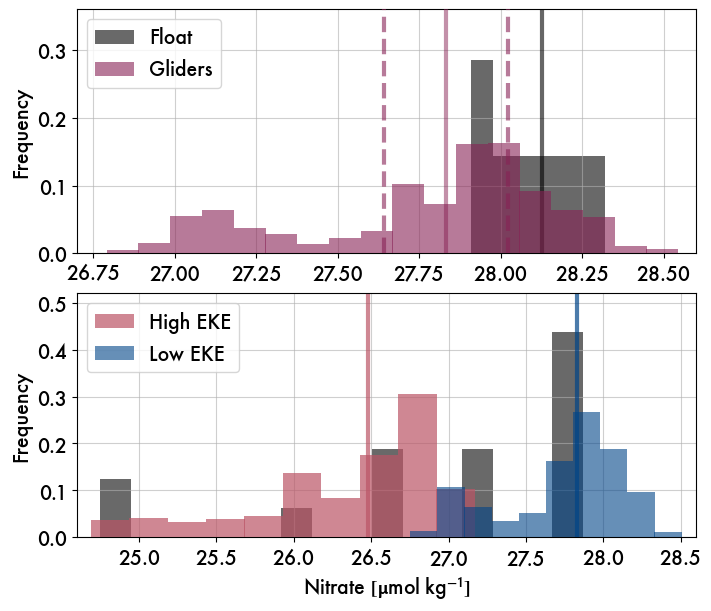

In [91]:
# PAPER fig comparison MEAN NITRATE ML
fig, axs = plt.subplots(2,1,figsize=(7,6), sharex=False, layout='constrained') # 14,12
axs = axs.flatten()

# First compare float vs gliders
ml_glids = pd.concat([mlstat_659, mlstat_660])
ml_glids = ml_glids[ml_glids.yearday>170]
flt = mlstat_float[mlstat_float.yearday>170]

ml_glids = ml_glids.nitrate_mean.dropna().values
flt = flt.nitrate_mean.dropna().values

# Plot comparison of platforms
for ax in axs[:1]:
    hist, bin_edges = np.histogram(flt, bins=6); freq = hist/np.sum(hist)
    ax.bar(bin_edges[:-1], freq, width = 0.069, color='dimgrey',alpha=1, label='Float', zorder=1)
    ax.vlines(flt.mean(), 0, 0.36, linestyle='-', alpha=0.6, linewidth=3, color='k', zorder=3)

    hist, bin_edges = np.histogram(ml_glids, bins=18); freq = hist/np.sum(hist)
    ax.bar(bin_edges[:-1], freq, width = 0.098, color='#882255',alpha=0.6, label='Gliders', zorder=3)
    ax.vlines(ml_glids.mean(), 0, 0.36, linestyle='-', alpha=0.5, linewidth=3, color='#882255', zorder=3)
    ax.vlines(ml_glids.mean() + 0.19, 0, 0.36, linestyle='--', alpha=0.6, linewidth=3, color='#882255', zorder=3)
    ax.vlines(ml_glids.mean() - 0.19, 0, 0.36, linestyle='--', alpha=0.6, linewidth=3, color='#882255', zorder=3)

    ax.set_ylim([0,0.36])
    ax.set_xlim([26.7, 28.6])
    ax.legend(loc='upper left', fontsize=14)

# Then compare high vs low EKE
ml_glids = pd.concat([mlstat_659, mlstat_660])
highEKE = ml_glids[ml_glids.yearday<150]
lowEKE = ml_glids[ml_glids.yearday>170]
highEKE = highEKE.dropna(subset=['nitrate_mean']).copy()
lowEKE = lowEKE.dropna(subset=['nitrate_mean']).copy()

hdat = highEKE.nitrate_mean.dropna()
ldat = lowEKE.nitrate_mean.dropna()
flt = mlstat_float.nitrate_mean.dropna()

for ax in axs[1:]:
    hist, bin_edges = np.histogram(flt, bins=6); freq = hist/np.sum(hist)
    ax.bar(bin_edges[:-1], freq, width = 0.2, alpha=1, facecolor = 'dimgrey', zorder=1)

    hist, bin_edges = np.histogram(hdat, bins=10); freq = hist/np.sum(hist)
    ax.bar(bin_edges[:-1], freq, width = 0.25, alpha=0.7, facecolor= eke_colors['high'], label='High EKE', zorder=3)

    hist, bin_edges = np.histogram(ldat, bins=10); freq = hist/np.sum(hist)
    ax.bar(bin_edges[:-1], freq, width = 0.176, alpha=0.6, facecolor = eke_colors['low'], label='Low EKE', zorder=3)

    ax.vlines(hdat.mean(), 0, 0.52, linestyle='-', alpha=0.7, linewidth=3, color=eke_colors['high'])
    ax.vlines(ldat.mean(), 0, 0.52, linestyle='-', alpha=0.7, linewidth=3, color=eke_colors['low'])
    ax.set_xlabel('Nitrate ' + umol_unit)
    ax.set_xlim([24.6, 28.6])
    ax.set_ylim([0, 0.52])
    # ax.set_title('Mean ML Nitrate between EKE regions', fontsize=14)
    ax.legend(loc='upper left', fontsize=14)

for ax in axs:
    ax.grid(zorder=0, alpha=0.6)
    ax.set_ylabel('Frequency')

# plt.savefig('../paper_figs/mlnitrate_1dhist.png', dpi=300)

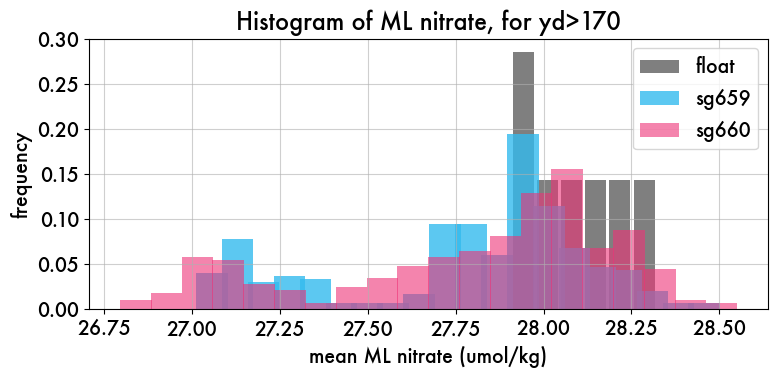

In [90]:
# Histogram of ML nitrate, separate gliders

f = plt.figure(figsize=(8,4), tight_layout=True)
ax = plt.gca()

ax.grid(zorder=1, alpha=0.6)

glid659 = mlstat_659[mlstat_659.yearday>170]
glid660 = mlstat_660[mlstat_660.yearday>170]
flt = mlstat_float[mlstat_float.yearday>170]

glid659 = glid659.nitrate_mean.dropna().values
glid660 = glid660.nitrate_mean.dropna().values
flt = flt.nitrate_mean.dropna().values


hist, bin_edges = np.histogram(flt, bins=6); freq = hist/np.sum(hist)
plt.bar(bin_edges[:-1], freq, width = 0.06, color='k',alpha=0.5, label='float')

hist, bin_edges = np.histogram(glid659, bins=20); freq = hist/np.sum(hist)
plt.bar(bin_edges[:-1], freq, width = 0.09, color=plat_colors['sg659'],alpha=0.8, label='sg659')

hist, bin_edges = np.histogram(glid660, bins=20); freq = hist/np.sum(hist)
plt.bar(bin_edges[:-1], freq, width = 0.09, color=plat_colors['sg660'],alpha=0.6, label='sg660')


# hist, bins_ = plt.hist(glid659, weights=np.ones_like(glid659)/np.sum(glid659) )

# ax.hist(flt, bins=20, density=True, alpha=0.5, facecolor = 'k', label='float', zorder=3)
# ax.hist(glid659, bins=20, density=True, alpha=0.5, facecolor= plat_colors['sg659'], label='sg659', zorder=3)
# ax.hist(glid660, bins=20, density=True, alpha=0.5, facecolor = plat_colors['sg660'], label='sg660', zorder=3)

ax.set_xlabel('mean ML nitrate (umol/kg)')
ax.set_title('Histogram of ML nitrate, for yd>170')
ax.set_ylabel('frequency')
plt.legend()



# PART 5: MAIN TIME SERIES COMPARISON

In [42]:
from mod_plot import *

(<Figure size 800x1200 with 8 Axes>,
 array([<AxesSubplot: title={'center': 'EKE'}, ylabel='$\\mathbf{[m^2~s^{-2}]}$'>,
        <AxesSubplot: title={'center': 'MLD'}, ylabel='[m]'>,
        <AxesSubplot: title={'center': '|$\\mathbf{\\nabla_h}\\mathregular{b}$|'}, ylabel='[s$ \\mathregular{^{-2}} $]'>,
        <AxesSubplot: title={'center': '$\\overline{\\mathregular{N}} \\mathregular{_{ML}}$ '}, ylabel='$\\mathbf{[\\mu} \\mathregular{mol~kg} \\mathbf{^{-1}]}$'>,
        <AxesSubplot: title={'center': '$\\mathbf{\\Delta }\\mathregular{N_{ML}}$ '}, ylabel='$\\mathbf{[\\mu} \\mathregular{mol~kg} \\mathbf{^{-1}]}$'>,
        <AxesSubplot: title={'center': 's$ \\mathbf{^2_{H,NO_3}}$ '}, ylabel='$\\mathbf{[\\mu} \\mathregular{mol^2~kg} \\mathbf{^{-2}]}$'>,
        <AxesSubplot: title={'center': 'bbp$_{\\mathregular{470}} $'}, ylabel='log([m$ \\mathbf{^{-1}} $])'>,
        <AxesSubplot: title={'center': 'PAR'}, xlabel='[Yearday]', ylabel='[W m$ \\mathbf{^{-1}} $]'>],
       dtype=object))

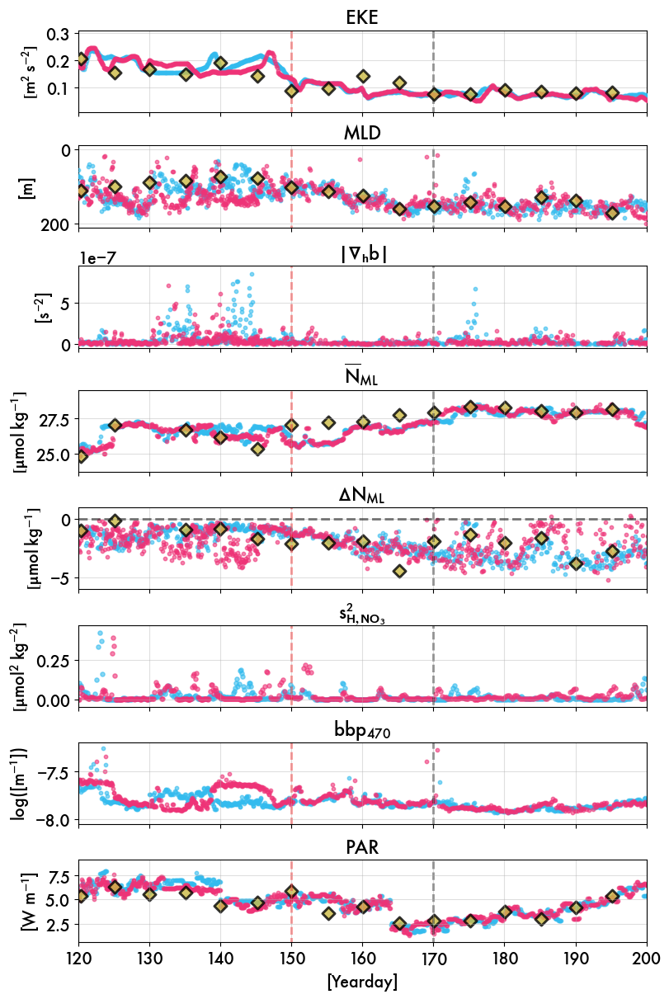

In [52]:
reload(sgplot)
sgplot.plt_time_series(fsize = (8,12), dotsize=10, diasize=60, titlesize=16, dateformat=False, legend=False)

Full titles

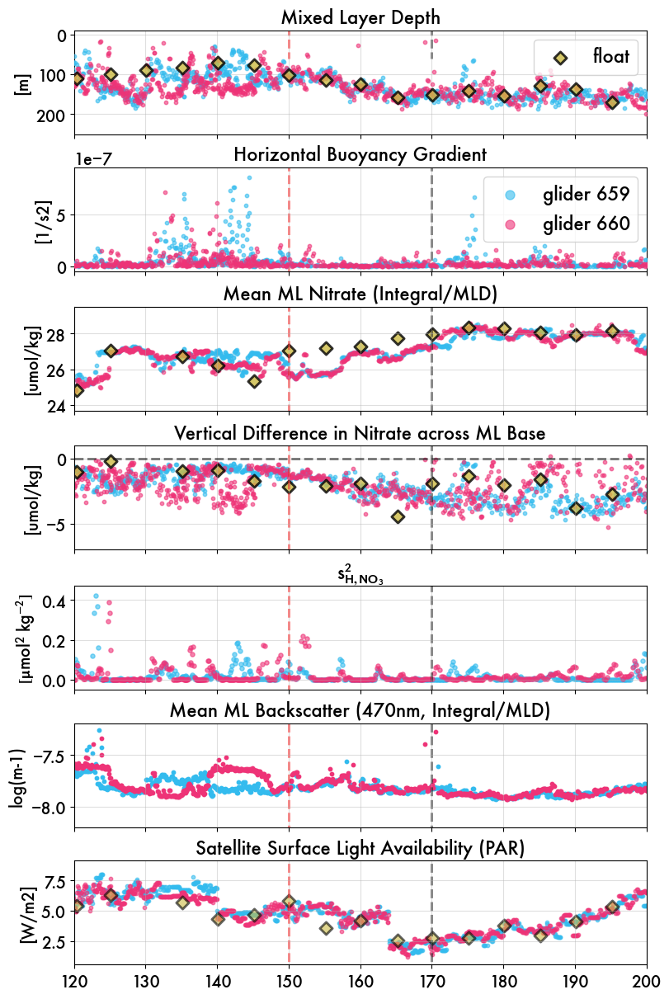

In [51]:
# Main Time Series
# Same as in mod_plot now, but long titles 

fig, axs = plt.subplots(7,1,figsize=(8,12), sharex=True, layout='constrained') # 14,12
axs = axs.flatten()
dotsize = 10
diasize = 60
titlesize=16

for ax in axs[0:1]:
    ax.scatter(mlstat_659.yearday, mlstat_659.mld, s=dotsize, alpha=0.6, color=plat_colors['sg659'], zorder=3)
    ax.scatter(mlstat_660.yearday, mlstat_660.mld, s=dotsize, alpha=0.6, color=plat_colors['sg660'], zorder=3)
    ax.scatter(dav_6030.yearday, dav_6030.mld, label='float',  marker='D', edgecolors='k', linewidth=2.1,
               s=diasize, alpha=0.8, color='#CCBB44', zorder=3)
    
    ax.set_ylabel('[m]')
    ax.invert_yaxis()
    ax.set_ylim([250, -10])
    ax.set_title(('Mixed Layer Depth'), fontsize=titlesize)
    ax.legend(fontsize=16, markerscale=1)

for ax in axs[1:2]:
    ax.scatter(mlstat_659.yearday, np.abs(mlstat_659.bx), label='glider 659', s=dotsize, alpha=0.6, color=plat_colors['sg659'], zorder=3)
    ax.scatter(mlstat_660.yearday, np.abs(mlstat_660.bx), label='glider 660', s=dotsize, alpha=0.6, color=plat_colors['sg660'], zorder=3)
    ax.set_ylabel('[1/s2]')
    ax.set_title('Horizontal Buoyancy Gradient', fontsize=titlesize) # @ (at 100m)
    ax.set_ylim([-5e-8, 0.95e-06])
    ax.legend(fontsize=16, markerscale=2.5)
# axs[0].scatter(df_659.yearday, df_659.pressure, c=df_659.nitrate, s=5, cmap=cmo.deep, zorder=1)
# axs[0].legend(loc='upper right', fontsize=20, facecolor='w', framealpha=1, markerscale=3)

for ax in axs[2:3]:
    ax.scatter(mlstat_659.yearday, mlstat_659.nitrate_mean, label='sg659', s=dotsize, alpha=0.6, color=plat_colors['sg659'])
    ax.scatter(mlstat_660.yearday, mlstat_660.nitrate_mean, label='sg660', s=dotsize, alpha=0.6, color=plat_colors['sg660'])
    ax.scatter(mlstat_float.yearday, mlstat_float.nitrate_mean, label='float',  marker='D', edgecolors='k', linewidth=2.1,
            s=diasize, alpha=0.8, color='#CCBB44')
    ax.set_ylabel('[umol/kg]')
    ax.set_ylim([23.7, 29.5])
    ax.set_title('Mean ML Nitrate (Integral/MLD)', fontsize=titlesize)

for ax in axs[3:4]:
    ax.scatter(mlstat_659.yearday, mlstat_659.nitrate_cross, label='sg659', s=dotsize, alpha=0.6, color=plat_colors['sg659'])
    ax.scatter(mlstat_660.yearday, mlstat_660.nitrate_cross, label='sg660', s=dotsize, alpha=0.6, color=plat_colors['sg660'])
    ax.scatter(mlstat_float.yearday, mlstat_float.nitrate_cross, label='float',  marker='D', edgecolors='k', linewidth=2.1,
                s=diasize, alpha=0.8, color='#CCBB44')
    ax.set_ylabel('[umol/kg]')
    ax.hlines(0, 120, 200, linestyle='--', linewidth=2.1, color='k', alpha=0.5)
    ax.set_ylim([-7, 1])
    ax.set_title('Vertical Difference in Nitrate across ML Base', fontsize=titlesize)
    
    # ax.scatter(mlvariance_659.yearday, mlvariance_659.nitrate, color=plat_colors['sg659'], alpha=0.8, label='sg659', s=dotsize) 
    # ax.scatter(mlvariance_660.yearday, mlvariance_660.nitrate, color=plat_colors['sg660'], alpha=0.8, label='sg660', s=dotsize)
    # ax.scatter(mlvariance_float.yearday, mlvariance_float.nitrate, marker='D', edgecolors='k', linewidth=2.1,
    #             s=diasize, alpha=0.8, color='#CCBB44')
    # ax.set_ylabel('[umol2/kg2]')
    # ax.set_ylim([-0.05, .39])

for ax in axs[4:5]:
    ax.scatter(hvariance_659.yearday, hvariance_659.nitrate_mean, label='sg659', s=dotsize+4, alpha=0.6, color=plat_colors['sg659'])
    ax.set_ylabel(umol_unit_squared) 
    ax.scatter(hvariance_660.yearday, hvariance_660.nitrate_mean, label='sg660', s=dotsize+4, alpha=0.6, color=plat_colors['sg660'])
    ax.set_ylim([-.05, 0.47])
    ax.set_title(hvar_title, fontsize=titlesize)


for ax in axs[5:6]:
    ax.scatter(mlstat_659.yearday, np.log(mlstat_659.bbp470_mean), label='sg659', s=dotsize, color=plat_colors['sg659'])
    ax.scatter(mlstat_660.yearday, np.log(mlstat_660.bbp470_mean), label='sg660', s=dotsize, color=plat_colors['sg660'])
    # ax.set_ylabel('[1/m]', fontsize=22)
    ax.set_ylabel('log(m-1)')
    ax.set_ylim([-8.2, -7.2])
    ax.set_title('Mean ML Backscatter (470nm, Integral/MLD)', fontsize=titlesize)

for ax in axs[6:7]:
    ax.scatter(mlstat_659.yearday, mlstat_659.par, label='par', s=dotsize, alpha=0.6, color=plat_colors['sg659'])
    ax.scatter(mlstat_660.yearday, mlstat_660.par, label='par', s=dotsize, alpha=0.6, color=plat_colors['sg660'])
    ax.scatter(mlstat_float.yearday, mlstat_float.par, label='par', s=diasize, alpha=0.6, color=plat_colors['float'],
               marker='D', edgecolors='k', linewidth=2.1)
    # ax.legend(loc='upper center')
    # ax.set_ylabel('[W/m2]', fontsize=22)
    ax.set_ylabel('[W/m2]') # PAR
    ax.set_ylim([0.6, 9.1])
    ax.set_title('Satellite Surface Light Availability (PAR)', fontsize=titlesize) 


# axs[2].set_title('ML nitrate vertical variance within single profile')


# axs[5].legend(fontsize=16)
# axs[-1].set_xlabel('Days since Jan 01 2019', fontsize=40)
for ax in axs:
    ax.grid(zorder=0, alpha=0.4)
    ax.set_xlim([120,200])
    # ax.legend()

    ax.vlines(150, -20,diasize, color='r', linewidth=2.1, alpha=0.5, linestyle='dashed', zorder=1)
    ax.vlines(170, -20,diasize, color='k', linewidth=2.1, alpha=0.5, linestyle='dashed', zorder=1)



In [255]:
# mlstat_659 = pd.read_csv('../working-vars/glider/mlstat_659_split2023.csv') # split: has unfixed bbp still in log
# mlstat_660 = pd.read_csv('../working-vars/glider/mlstat_660_split2023.csv')

# END MAIN


---------

# Supplementary:

- Old code, sometimes for troubleshooting only

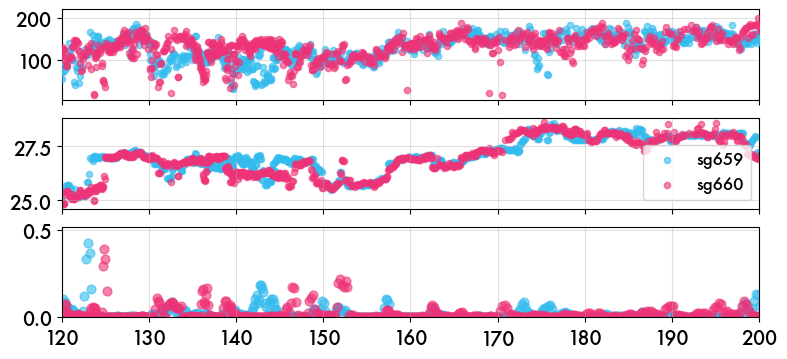

In [59]:
# Compare ML depth, variable mean, and variable variance
# BOTH  GLIDER
fig, axs = plt.subplots(3,1,figsize=(9,4), sharex=True)
axs = axs.flatten()

# axs[0].scatter(df_659.yearday, df_659.pressure, c=df_659.nitrate, s=5, cmap=cmo.deep, zorder=1)

axs[0].scatter(mlstat_659.yearday, mlstat_659.mld, label='mld', s=20, alpha=0.6, color=plat_colors['sg659'], zorder=3)
axs[0].scatter(mlstat_660.yearday, mlstat_660.mld, label='mld', s=20, alpha=0.6, color=plat_colors['sg660'], zorder=3)

# axs[0].set_ylabel('depth (m)')

axs[1].scatter(mlstat_659.yearday, mlstat_659.nitrate_mean, label='sg659', s=20, alpha=0.6, color=plat_colors['sg659'])
axs[1].scatter(mlstat_660.yearday, mlstat_660.nitrate_mean, label='sg660', s=20, alpha=0.6, color=plat_colors['sg660'])

# axs[1].set_ylabel('umol/m2/m')
axs[1].legend(loc='lower right', fontsize=12)

axs[2].scatter(hvariance_659.yearday, hvariance_659.nitrate_mean, label='variance', s=40, alpha=0.6, color=plat_colors['sg659'])
# axs[2].set_yscale('log')
# axs[2].plot(mlstat_659.yearday, mlstat_659.nitrate_variance, linewidth=2, alpha=0.2)

axs[2].scatter(hvariance_660.yearday, hvariance_660.nitrate_mean, label='variance', s=40, alpha=0.6, color=plat_colors['sg660'])
# axs[2].plot(mlstat_660.yearday, mlstat_660.nitrate_variance, linewidth=2, alpha=0.2)


# axs[2].legend(loc='upper center')

# axs[0].set_title(('mixed layer depth'), fontsize=22)
# axs[1].set_title('ML nitrate mean (integrated/mld)', fontsize=22)
# axs[2].set_title('ML nitrate horizontal variance', fontsize=22)

# axs[2].set_ylabel('(umol/kg)^2')
axs[2].set_ylim([0, 0.52])


for ax in axs:
    ax.grid(zorder=0, alpha=0.4)
    ax.set_xlim([120,200])
    # ax.legend()


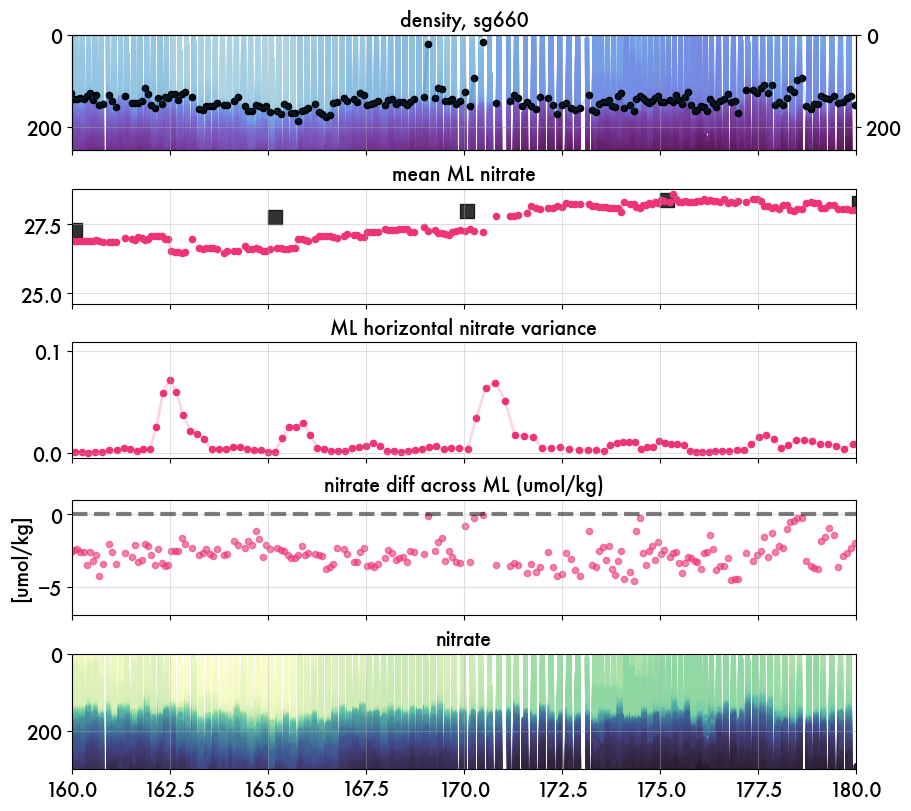

In [66]:
# SINGLE GLIDER: Compare ML depth, variable total, and variable variance
# SINGLE GLIDER
fig, axs = plt.subplots(5,1,figsize=(9,8), sharex=True, layout='constrained')
axs = axs.flatten()


dat_660 = df_660[df_660.pressure<300]
dat_660 = dat_660[(dat_660.yearday>160) & (dat_660.yearday<180)]

sca = axs[0].scatter(dat_660.yearday, dat_660.pressure, c=dat_660.sigma0, s=5, cmap=cmo.dense, zorder=1)
axs[0].invert_yaxis()
axs[0].set_ylim([250,0])
# fig.colorbar(sca, ax=axs[0]).set_label('density (kg/m3)')


twax = axs[0].twinx()
twax.scatter(mlstat_660.yearday, mlstat_660.mld, label='mld', s=20, color='k', zorder=3)
twax.plot(mlstat_660.yearday, mlstat_660.mld, linewidth=2, alpha=0.2, zorder=3)

twax.set_title(('density, sg660'), fontsize=14)
twax.invert_yaxis()
twax.set_ylim([250,0])

# axs[0].legend(loc='center')

axs[1].scatter(mlstat_float.yearday, mlstat_float.nitrate_mean, label='float',  marker='s', s=90, alpha=0.8, color='k')
axs[1].scatter(mlstat_660.yearday, mlstat_660.nitrate_mean, label='sg660', s=20, color=plat_colors['sg660'])
axs[1].plot(mlstat_660.yearday, mlstat_660.nitrate_mean, linewidth=2, alpha=0.2, color=plat_colors['sg660'])
axs[1].set_title('mean ML nitrate', fontsize=14)
# axs[1].legend(loc='lower right')


hv_660 = hvariance_660[hvariance_660.yearday>160]
axs[2].scatter(hv_660.yearday, hv_660.nitrate_mean, label='variance', s=20, color=plat_colors['sg660'])
axs[2].plot(hv_660.yearday, hv_660.nitrate_mean, linewidth=2, alpha=0.2, color=plat_colors['sg660'])
# axs[2].legend(loc='upper center')
axs[2].set_title('ML horizontal nitrate variance', fontsize=14)

axs[3].scatter(mlstat_660.yearday, mlstat_660.nitrate_cross, label='sg660', s=20, alpha=0.6, color=plat_colors['sg660'])
axs[3].set_ylabel('[umol/kg]')
axs[3].set_ylim([-7, 1])
axs[3].hlines(0, 160, 200, linestyle='--', linewidth=3, color='k', alpha=0.5)
axs[3].set_title('nitrate diff across ML (umol/kg)', fontsize=14)

axs[4].scatter(dat_660.yearday, dat_660.pressure, c=dat_660.nitrate, s=5, cmap=cmo.deep, zorder=1)
axs[4].set_title('nitrate', fontsize=14)
axs[4].invert_yaxis()
axs[4].set_ylim([300,0])


for ax in axs:
    ax.grid(zorder=0, alpha=0.4)
    ax.set_xlim([160,180])
    # ax.legend()


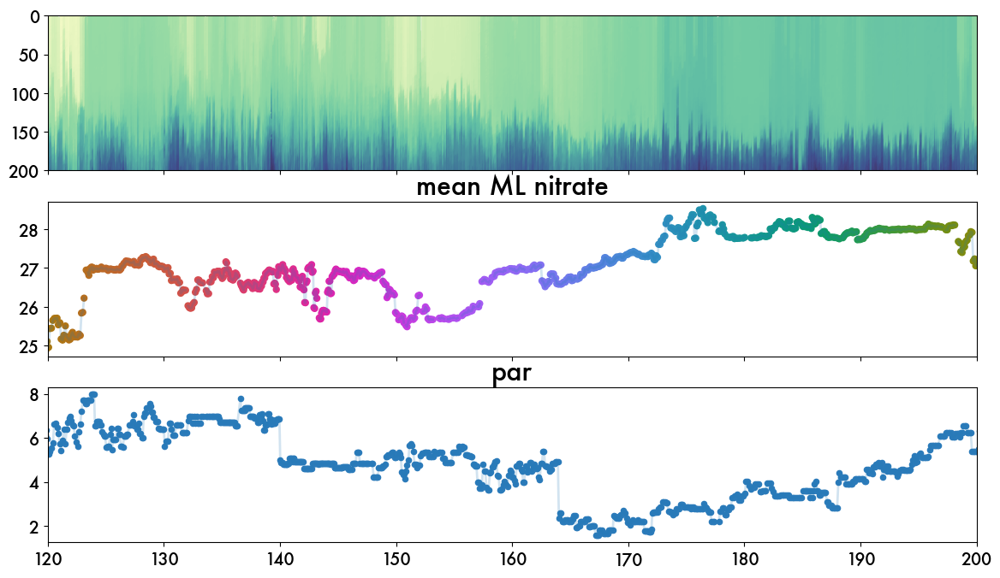

In [68]:
# SINGLE GLIDER: Mean nitrate and PAR
fig, axs = plt.subplots(3,1,figsize=(14,8), sharex=True)
axs = axs.flatten()

axs[0].scatter(df_659.yearday, df_659.pressure, c=df_659.nitrate, s=5, cmap=cmo.deep, zorder=1)
axs[0].invert_yaxis()
axs[0].set_ylim([200,0])

twax = axs[0].twinx()
twax.scatter(mlstat_659.yearday, mlstat_659.mld, label='mld', s=20, color='k', zorder=3)
twax.plot(mlstat_659.yearday, mlstat_659.mld, linewidth=2, alpha=0.2, zorder=3)
twax.set_title(('mixed layer depth, sg659'), fontsize=22)
twax.invert_yaxis()

axs[0].legend(loc='center')

axs[1].scatter(mlstat_659.yearday, mlstat_659.nitrate_mean, label='mean', s=25, c=mlstat_659.yearday, cmap=cmo.phase) #color=model_palettes['Model_G'])
axs[1].plot(mlstat_659.yearday, mlstat_659.nitrate_mean, linewidth=2, alpha=0.2)
axs[1].set_title('mean ML nitrate', fontsize=22)
# axs[1].legend(loc='lower right')

axs[2].scatter(mlstat_659.yearday, mlstat_659.par, label='par', s=20, color=model_palettes['Model_D'])
axs[2].plot(mlstat_659.yearday, mlstat_659.par, linewidth=2, alpha=0.2)
# axs[2].legend(loc='upper center')
axs[2].set_title('par', fontsize=22)


for ax in axs:
    # ax.grid(zorder=0, alpha=0.4)
    ax.set_xlim([120,200])
    # ax.legend()


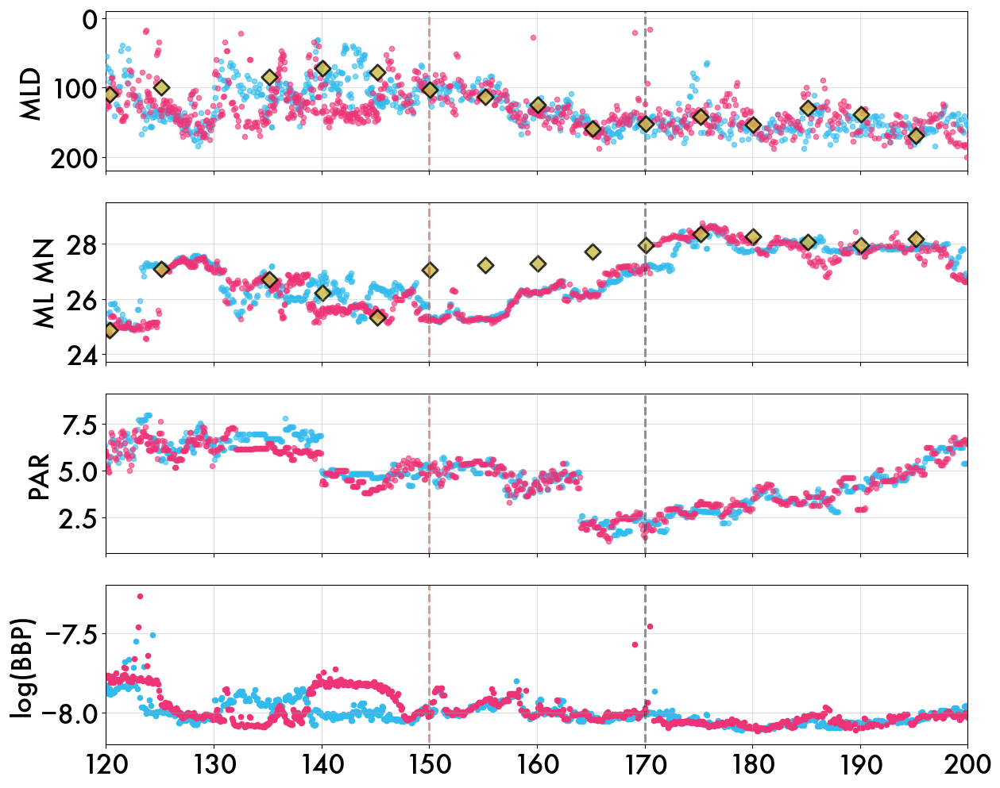

In [381]:
# BIOLOGY ONLY: BOTH GLIDER PAR and BBP
fig, axs = plt.subplots(4,1,figsize=(14,12), sharex=True)
axs = axs.flatten()

# fig, axs = plt.subplots(5,1,figsize=(14,15), sharex=True, layout='constrained') # 14,12
# axs = axs.flatten()

for ax in axs[0:1]:
    ax.scatter(mlstat_659.yearday, mlstat_659.mld, label='sg659', s=20, alpha=0.6, color=glid_colors['sg659'], zorder=3)
    ax.scatter(mlstat_660.yearday, mlstat_660.mld, label='sg660', s=20, alpha=0.6, color=glid_colors['sg660'], zorder=3)
    ax.scatter(dav_float.yearday, dav_float.mld, label='float',  marker='D', edgecolors='k', linewidth=2,
               s=100, alpha=0.8, color='#CCBB44', zorder=3)
    
    # ax.set_ylabel('[m]', fontsize=22)
    ax.set_ylabel('MLD')
    ax.invert_yaxis()
    ax.set_ylim([220, -10])

# axs[0].legend(loc='center')
for ax in axs[1:2]:
    ax.scatter(mlstat_659.yearday, mlstat_659.nitrate_mean, label='sg659', s=20, alpha=0.6, color=glid_colors['sg659'])
    ax.scatter(mlstat_660.yearday, mlstat_660.nitrate_mean, label='sg660', s=20, alpha=0.6, color=glid_colors['sg660'])
    ax.scatter(mlstat_float.yearday, mlstat_float.nitrate_mean, label='float',  marker='D', edgecolors='k', linewidth=2,
            s=100, alpha=0.8, color='#CCBB44')
    # ax.set_ylabel('[umol/kg]', fontsize=22)
    ax.set_ylabel('ML MN')
    ax.set_ylim([23.7, 29.5])

# axs[1].legend(loc='lower right')
# axs[1].legend(loc='lower right', fontsize=20, facecolor='w', framealpha=1, markerscale=3)

for ax in axs[2:3]:
    ax.scatter(mlstat_659.yearday, mlstat_659.par, label='par', s=20, alpha=0.6, color=glid_colors['sg659'])
    ax.scatter(mlstat_660.yearday, mlstat_660.par, label='par', s=20, alpha=0.6, color=glid_colors['sg660'])
    # ax.legend(loc='upper center')
    # ax.set_ylabel('[W/m2]', fontsize=22)
    ax.set_ylabel('PAR')
    ax.set_ylim([0.6, 9.1])

for ax in axs[3:4]:
    ax.scatter(mlstat_659.yearday, mlstat_659.bbp470_mean, label='sg659', s=20, color=glid_colors['sg659'])
    ax.scatter(mlstat_660.yearday, mlstat_660.bbp470_mean, label='sg660', s=20, color=glid_colors['sg660'])
    # ax.set_ylabel('[1/m]', fontsize=22)
    ax.set_ylabel('log(BBP)')
    ax.set_ylim([-8.2, -7.2])
# ax.set_yscale('log')
# ax.legend(['sg659', 'sg660'], loc='upper right', fontsize=18)

# axs[0].set_title('mixed layer depth', fontsize=22)
# axs[1].set_title('mean ML nitrate', fontsize=22)
# ax.set_title('PAR', fontsize=22)
# ax.set_title('log(bbp470)', fontsize=22)


for ax in axs:
    ax.grid(zorder=0, alpha=0.4)
    ax.set_xlim([120,200])
    # ax.legend()
    ax.vlines(150, -20,250, color='r', linewidth=2, alpha=0.5, linestyle='dashed', zorder=1)
    ax.vlines(170, -20,250, color='k', linewidth=2, alpha=0.5, linestyle='dashed', zorder=1)


# Miscellaneous Sections (practice)

(27.94, 26.84)

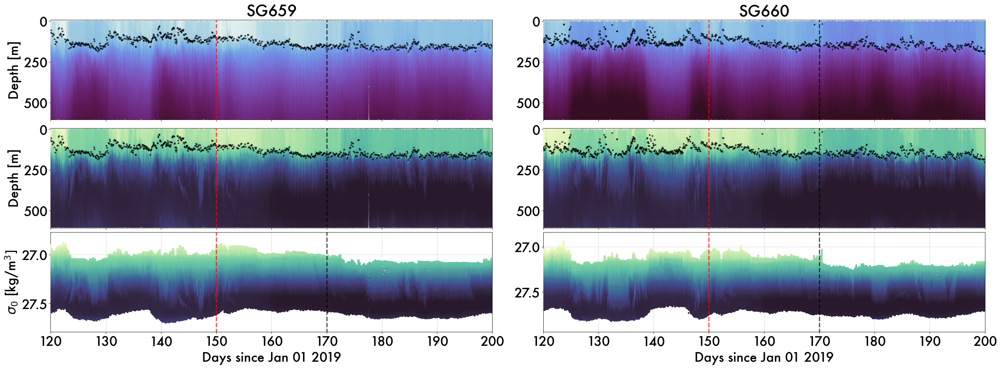

In [ ]:
# PAPER FIG: fig:glider_sections
glidtag = 'sg660'

# fig = plt.figure(figsize=(16,4)) # 16,4
# ax = fig.gca()
fsize=(18,11) # good for paper fig
fsize=(30,11)
fig, axs = plt.subplots(3,2, figsize=fsize, sharex=True, layout='constrained')
# axs = axs.flatten()

depth = 600
df_glid = df_659[df_659.pressure<depth]
sca = axs[0, 0].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.sigma0, cmap=cmo.dense, s=8, zorder=3, vmin=26.9, vmax=27.74)
sca2 = axs[1, 0].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.nitrate, cmap=cmo.deep, s=8, zorder=3, vmin=24.0, vmax=35.6)
sca3 = axs[2, 0].scatter(df_glid.yearday, df_glid.sigma0, c=df_glid.nitrate, cmap=cmo.deep, s=8, zorder=3, vmin=24.0, vmax=35.6)
# sca3 = axs[2, 0].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.spice, cmap='Oranges', s=8, zorder=3, vmin=24.0, vmax=36)

df_glid = df_660[df_660.pressure<depth]
sca = axs[0, 1].scatter(df_glid.yearday, df_glid.pressure,c=df_glid.sigma0, cmap=cmo.dense, s=8, zorder=3, vmin=26.9, vmax=27.74)
sca2 = axs[1, 1].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.nitrate, cmap=cmo.deep, s=8, zorder=3, vmin=24.0, vmax=35.6)
sca3 = axs[2, 1].scatter(df_glid.yearday, df_glid.sigma0, c=df_glid.nitrate, cmap=cmo.deep, s=8, zorder=3, vmin=24.0, vmax=35.6)

# sca3 = axs[2, 1].scatter(df_glid.yearday, df_glid.pressure, c=df_glid.spice, cmap='Oranges',  s=8, zorder=3, vmin=24.0, vmax=36)

axs[0,0].set_title('SG659')
axs[0,1].set_title('SG660')

axs[2,0].set_xlabel('Days since Jan 01 2019')
axs[2,1].set_xlabel('Days since Jan 01 2019')


# Plot left columns, depths 
for ax in axs[0:2, 0]:
    ax.scatter(dav_659.yearday, dav_659.mld, s=8, c='k', alpha=0.6, zorder=3)
    ax.set_ylabel('Depth [m]')
    ax.set_ylim([-8,depth+5])

# Plot right column, depths
for ax in axs[0:2, 1]:
    ax.scatter(dav_660.yearday, dav_660.mld, s=8, c='k', alpha=0.6, zorder=3)
    ax.set_ylim([-8, depth+5])
    # ax.set_yticks([])

axs[2,0].set_ylabel('$\sigma_0$ [kg/m'+ r'$\mathrm{^3]}$')

# Plot EKE lines and set x range
for ax in axs.flatten():
    ax.vlines(150, -20,depth, color='r', linewidth=2.5, linestyle='dashed', alpha=0.7, zorder=3)
    ax.vlines(170, -20,depth, color='k', linewidth=2.5, linestyle='dashed', alpha=0.7, zorder=3)
    ax.set_xlim([120, 200])
    ax.invert_yaxis()

# Set limites
for ax in axs[0:2,0]:
    ax.set_ylim([depth+5,-8])
for ax in axs[2,:]:
    ax.grid(zorder=1, alpha=0.5)

axs[2,0].set_ylim([27.79, 26.77])
axs[2,1].set_ylim([27.94, 26.84])
    

# plt.colorbar(sca, ax=axs[0,1]).set_label('$\sigma_0$ [kg/m'+ r'$\mathrm{^3]}$', fontsize=28)
# plt.colorbar(sca2, shrink=0.4, ax=axs[1:3,1]).set_label('Nitrate [umol/kg]', fontsize=28)
# plt.colorbar(sca3, shrink=0.9, ax=axs[2,1]).set_label('Nitrate [umol/kg]', fontsize=28)

# plt.colorbar(sca2, shrink=0.9, ax=axs[1,1]).set_label(r'$ \tau $' + '[m' + r'$\mathrm{^3}$' + '/kg]', fontsize=28)


# Flatten to plot over all
# axs=axs.flatten()


# plt.legend(fontsize=28, loc="lower right")
# plt.title('isopycnal depth, ' + glidtag)




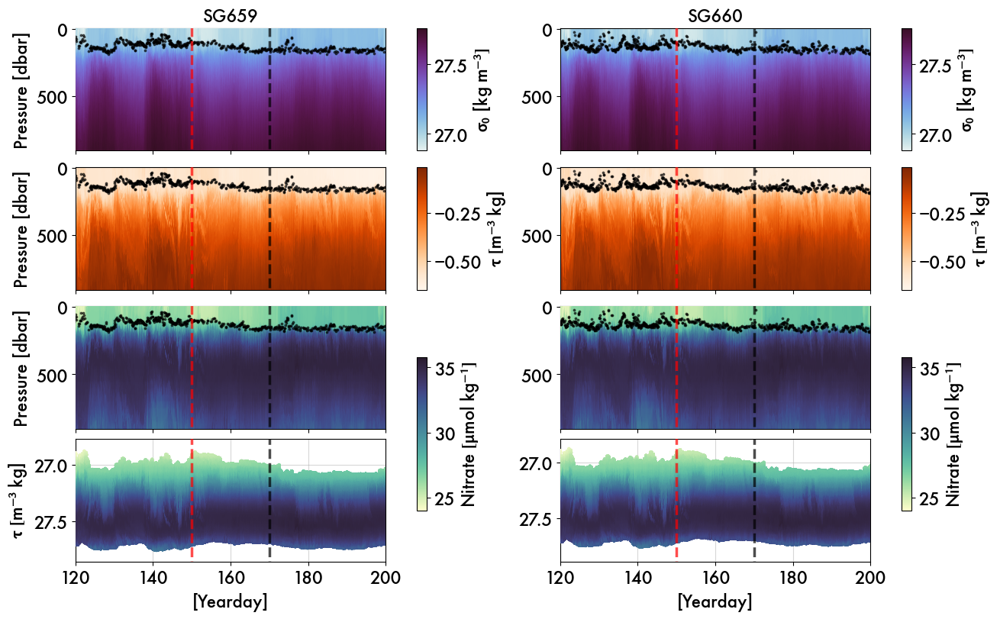

(<Figure size 1300x800 with 14 Axes>,
 array([[<AxesSubplot: title={'center': 'SG659'}, ylabel='Pressure [dbar]'>,
         <AxesSubplot: title={'center': 'SG660'}>],
        [<AxesSubplot: ylabel='Pressure [dbar]'>, <AxesSubplot: >],
        [<AxesSubplot: ylabel='Pressure [dbar]'>, <AxesSubplot: >],
        [<AxesSubplot: xlabel='[Yearday]', ylabel='$ \\mathbf{\\tau} $ $\\mathbf{[m^{-3}~}$kg]'>,
         <AxesSubplot: xlabel='[Yearday]'>]], dtype=object))

In [ ]:
reload(sgplot)
sgplot.plt_glider_sections(preslim=900, fsize=(13,8), font = 16, dateformat=False)

(120.0, 200.0)

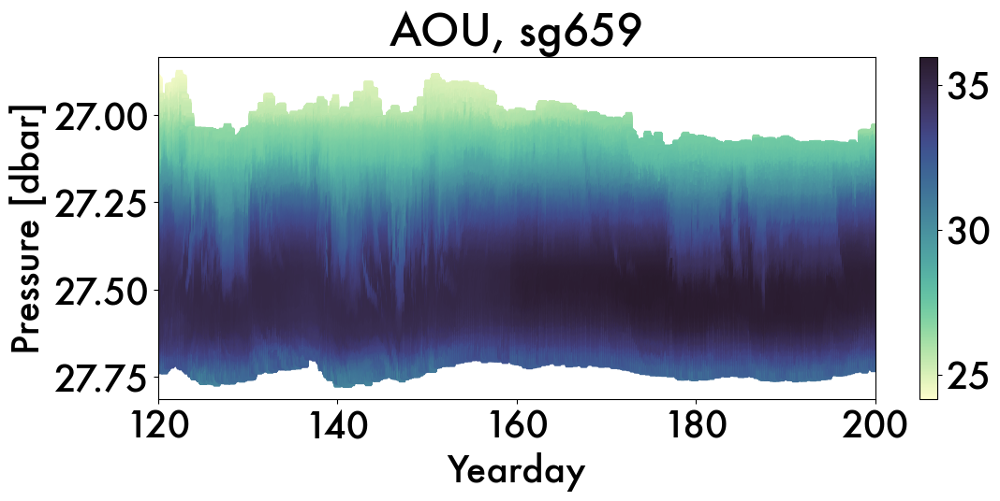

In [ ]:
minday = 120
maxday = 200
fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()


# dat = mldf_659[(mldf_659.yearday <maxday) & (mldf_659.yearday > minday)]
dat = df_659[(df_659.yearday <maxday) & (df_659.yearday > minday)]

# tag = 'oxygen, sg659'
# total = ax.scatter(df_659.yearday, df_659.pressure, c=df_659.oxygen, cmap=cmo.ice, s=20, marker='s', vmax=360)

# tag = 'oxygen percent saturation, sg659'
# total = ax.scatter(df_659.yearday, df_659.pressure, c=df_659.o2persat, cmap=cmo.ice, s=20, marker='s', vmax=1.1)

tag = 'AOU, sg659'
total = ax.scatter(df_659.yearday, df_659.sigma0, c=df_659.nitrate, cmap=cmo.deep, s=20, marker='s')


# tag = 'nitrate, sg659'
# total = ax.scatter(df_659.yearday, df_659.pressure, c=df_659.nitrate_G, cmap=cmo.deep, s=20, marker='s')


# ax.scatter(dav_659.yearday, dav_659.mld, s=5, c='k', alpha=0.2)
# ax.plot(dav_659.yearday, dav_659.mld, c='k', linewidth=2, alpha=0.2)
# ax.scatter(mldf_659.yearday, mldf_659.mld, s=1, c='k', alpha=0.05)
# ax.plot(mldf_659.yearday, mldf_659.mld, c='k', linewidth=2, alpha=0.1)


ax.set_title(tag )
plt.colorbar(total, ax=ax) #.set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure [dbar]')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
# ax.set_ylim([250,0])

In [ ]:
f = plt.figure(figsize=(12,6), tight_layout=True)

def plot_ML_profile(mlstat, df_glid, var='nitrate_G', title='', minday=120, maxday=200, fig=None):

    df_glid = df_glid[(df_glid.yearday <maxday) & (df_glid.yearday > minday)]
    dat = mlstat[(mlstat.yearday <maxday) & (mlstat.yearday > minday)]
    ax = fig.add_subplot(1,1,1)

    if var=='bbp470':
        cvar = np.log(df_glid[var])
    else:
        cvar = df_glid[var]

    if var=='bbp470':
        colmap = cmo.rain
    if var=='nitrate':
        colmap = cmo.deep
    if var=='oxygen':
        colmap = cmo.ice
    if var == 'sigma0':
        colmap = cmo.dense

    total = ax.scatter(df_glid.yearday, df_glid.pressure, c=cvar, cmap=colmap, s=20, marker='s') #, vmin=-8.05, vmax=-7.05)
    ax.scatter(dat.yearday, dat.mld, s=7, c='k', alpha=0.2)
    # ax.plot(dat.yearday, dat.mld, c='k', linewidth=2, alpha=0.2)

    ax.set_title(var)
    plt.colorbar(total, ax=ax)

    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlabel('Yearday')
    ax.set_xlim([minday, maxday])
    ax.set_ylim([250,0])

    ax.set_title(title)

    plt.show()

    return fig

<Figure size 1200x600 with 0 Axes>

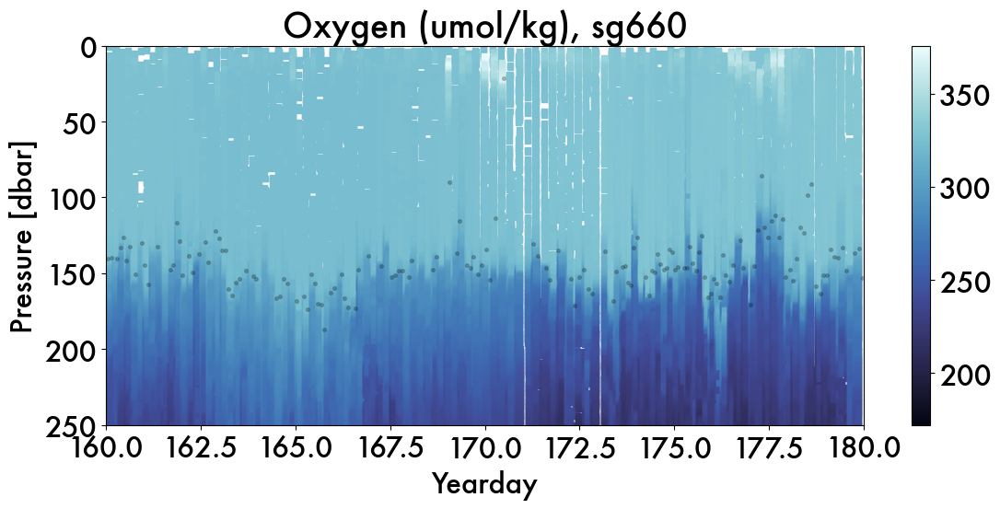

In [ ]:
# f = plt.figure(figsize=(12,6), tight_layout=True)
# fig = plot_ML_profile(mlstat_660, df_660, var='nitrate', title='Nitrate (umol/kg), sg660',
#                       minday=160, maxday=180, fig=f)

f = plt.figure(figsize=(12,6), tight_layout=True)
fig = plot_ML_profile(mlstat_660, df_660, var='oxygen', title='Oxygen (umol/kg), sg660',
                      minday=160, maxday=180, fig=f)

# f = plt.figure(figsize=(12,6), tight_layout=True)
# fig = plot_ML_profile(mlstat_660, df_660, var='bbp470', title='log(bbp470), sg660',
#                       minday=160, maxday=180, fig=f)

# f = plt.figure(figsize=(12,6), tight_layout=True)
# fig = plot_ML_profile(mlstat_660, df_660, var='sigma0', title='density (kg/m3), sg660',
#                       minday=160, maxday=180, fig=f)

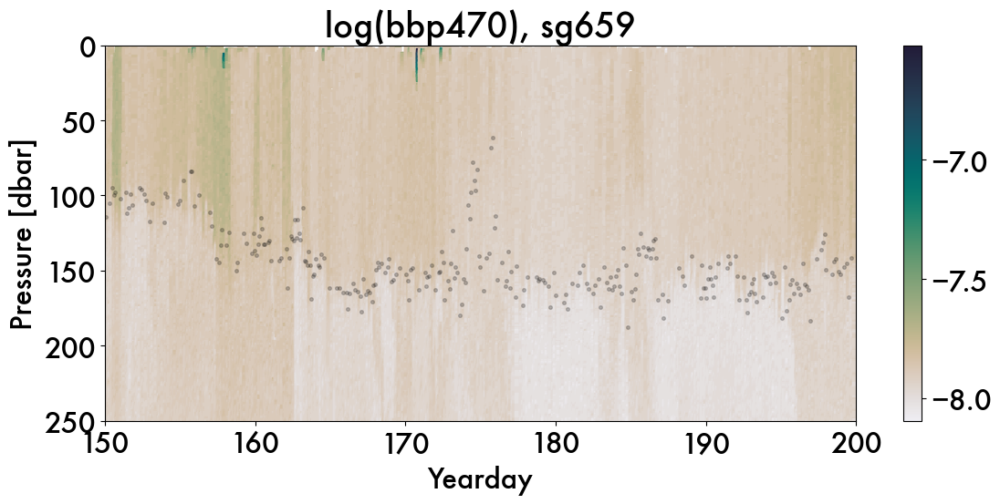

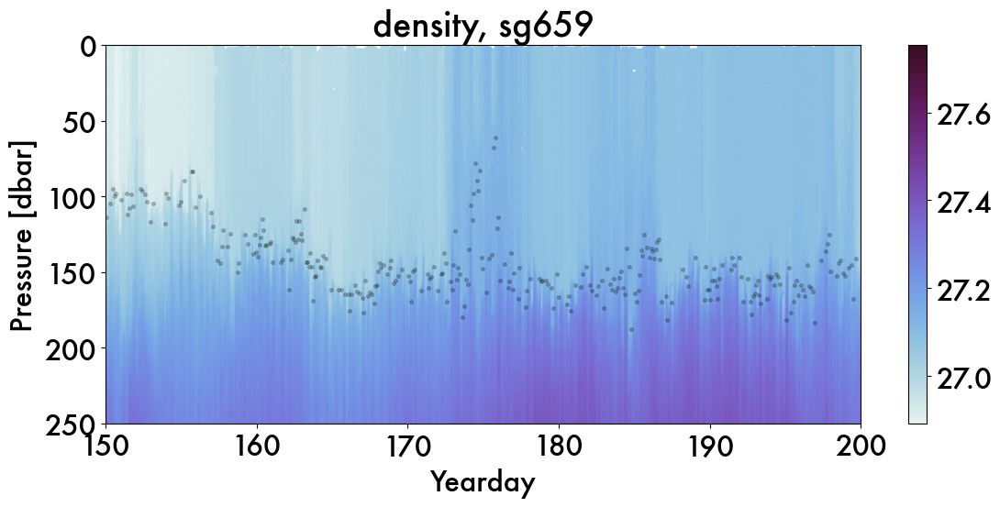

In [ ]:
f = plt.figure(figsize=(12,6), tight_layout=True)
fig = plot_ML_profile(mlstat_659, df_659, var='bbp470', title='log(bbp470), sg659',
                      minday=150, maxday=200, fig=f)

f = plt.figure(figsize=(12,6), tight_layout=True)
fig = plot_ML_profile(mlstat_659, df_659, var='sigma0', title='density, sg659',
                      minday=150, maxday=200, fig=f)

(260.0, 0.0)

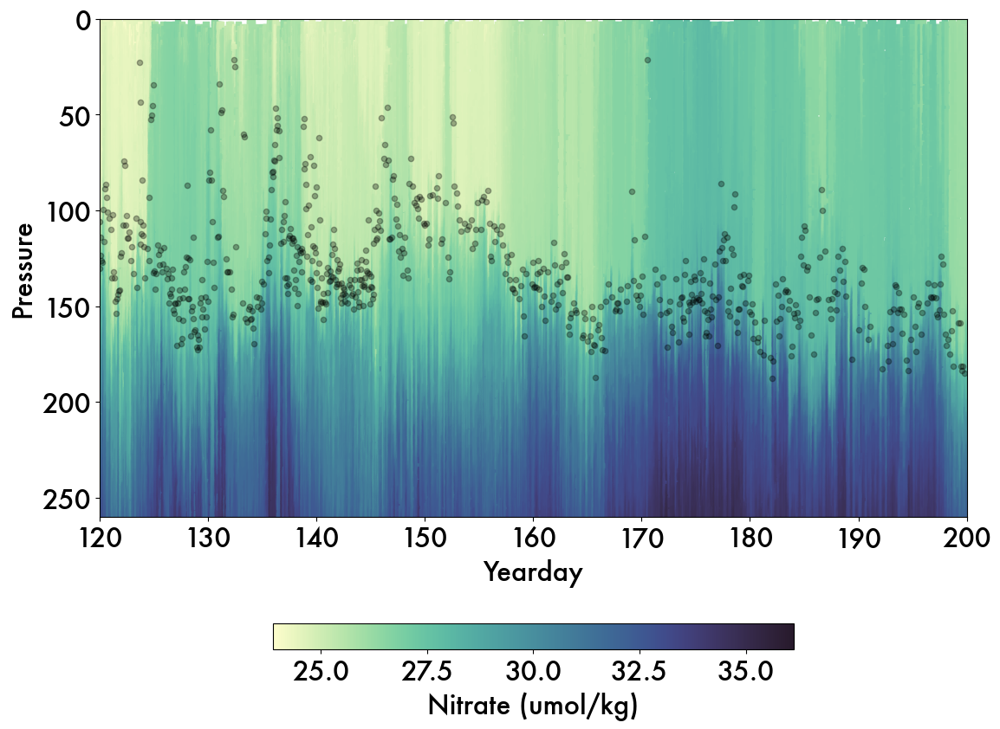

In [ ]:
# nitrate plot outside method
minday = 120
maxday = 200

dat = mlstat_660[(mlstat_660.yearday <maxday) & (mlstat_660.yearday > minday)]

densityfig  = plt.figure(figsize=(12,9), tight_layout=True)
ax = plt.gca()

total = ax.scatter(df_660.yearday, df_660.pressure, c=df_660.nitrate, cmap=cmo.deep, s=20, marker='s') 
ax.scatter(dat.yearday, dat.mld, s=20, c='k', alpha=0.3)
# ax.plot(dat.yearday, dat.mld, c='k', linewidth=2, alpha=0.2)

# ax.set_title('Nitrate, sg660')
# plt.colorbar(total, ax=ax)
plt.colorbar(total, ax=ax, orientation='horizontal', shrink=0.6).set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([260,0])

In [ ]:
# troubleshooting method

df_glid = df_659
dav_glid = dav_659

mldf_glid = pd.DataFrame()

mlstats = dav_glid.copy()
ml_varlist = ['nitrate_var', 'nitrate_mean', 
            'bbp470_var', 'bbp470_mean', 'bbp700_var', 'bbp700_mean',
            'oxygen_var, oxygen_mean']

for var in ml_varlist:
    mlstats[var] = np.tile(np.nan, mlstats.shape[0])


for i, prof in enumerate(dfproc.list_profile_DFs(df_glid)):
    # values that are the same for whole profile
    mlp = mlstats.mld[i]

    # Now store all the mldata observations in mldf
    if mlp != np.nan:
        upperprof = prof[prof.pressure<mlp].copy()

        mlp_array = np.tile(mlp, upperprof.shape[0])
        upperprof['mld'] = mlp_array

        mldf_glid = pd.concat([mldf_glid, upperprof], ignore_index=True)

#         # now make the mlstats, which just adds upon dav_glid 
        mlstats.iloc[i]['nitrate_var'] = np.var(upperprof.nitrate_G)
#         mlstats.iloc[i]['nitrate_mean'] = np.mean(upperprof.nitrate_G)
#         mlstats.iloc[i]['bbp470_var'] = np.var(np.log(upperprof.bbp470))  # note bbp is log
#         mlstats.iloc[i]['bbp470_mean'] = np.mean(np.log(upperprof.bbp470))
#         mlstats.iloc[i]['bbp700_var'] = np.var(np.log(upperprof.bbp700))
#         mlstats.iloc[i]['bbp700_mean'] = np.mean(np.log(upperprof.bbp700))
#         mlstats.iloc[i]['oxygen_var'] = np.var(upperprof.oxygen)
#         mlstats.iloc[i]['oxygen_mean'] = np.mean(upperprof.oxygen)



Text(0.5, 0, 'yearday')

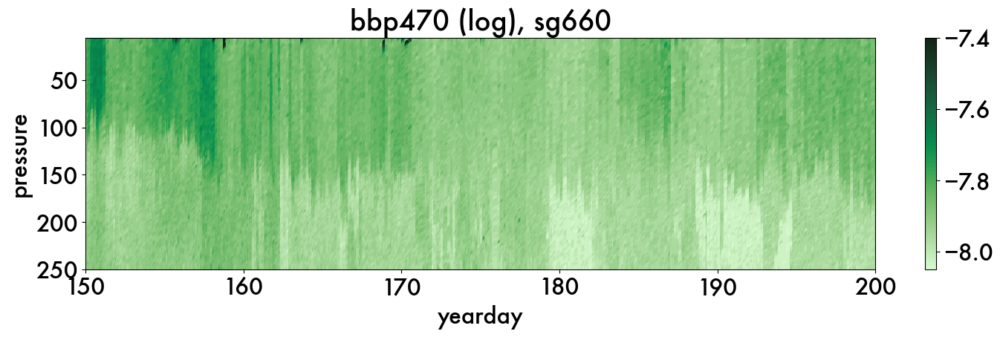

In [ ]:
fig = plt.figure(figsize=(15,5), layout="tight")
ax=fig.gca()

dat = df_660[df_660.pressure<250]
dat = dat[dat.yearday>150]

sca = ax.scatter(dat.yearday, dat.pressure, c=np.log(dat.bbp470), cmap=cmo.algae, s=40, vmin= -8.05, vmax=-7.4)
ax.set_title('bbp470 (log), sg660')
ax.invert_yaxis()
ax.set_xlim([150, 200])
ax.set_ylim([250, 5])
plt.colorbar(sca, ax=ax)

ax.set_ylabel('pressure')
ax.set_xlabel('yearday')

## Other time series practice

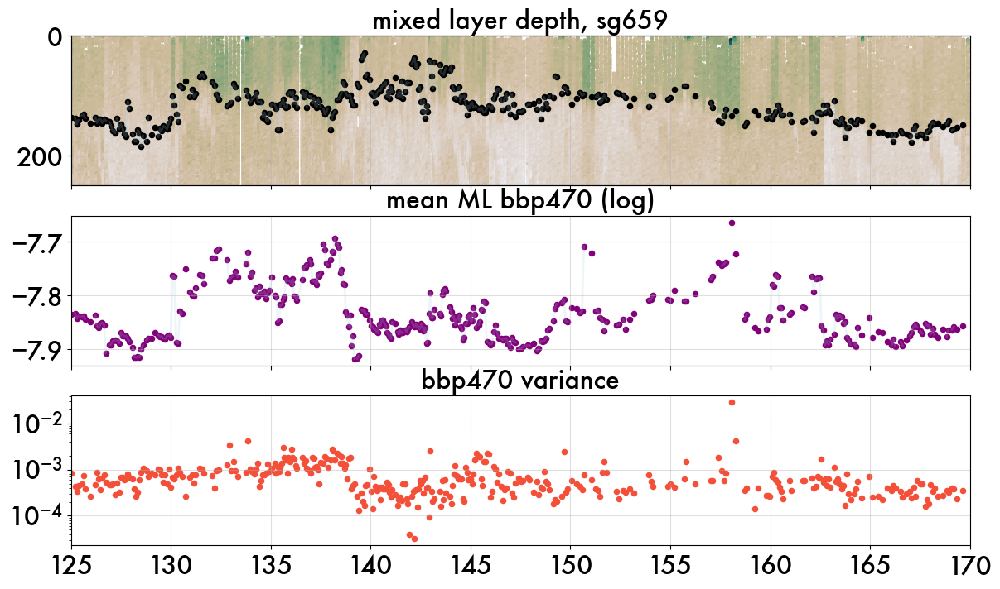

In [ ]:
# SINGLE: BBP STATS
fig, axs = plt.subplots(3,1,figsize=(14,8), sharex=True)
axs = axs.flatten()

minday=125
maxday=170

dat_glid = df_659[(df_659.yearday <maxday) & (df_659.yearday > minday)]
dat_mlstat = mlstat_659[(mlstat_659.yearday <maxday) & (mlstat_659.yearday > minday)]

axs[0].scatter(dat_glid.yearday, dat_glid.pressure, c=np.log(dat_glid.bbp470), s=5, cmap=cmo.rain, zorder=1)
axs[0].invert_yaxis()
axs[0].set_ylim([250,0])

twax = axs[0].twinx()
twax.scatter(dat_mlstat.yearday, dat_mlstat.mld, label='mld', s=20, color='k', zorder=3)
twax.plot(dat_mlstat.yearday, dat_mlstat.mld, linewidth=2, alpha=0.2, zorder=3)
twax.set_title(('mixed layer depth, sg659'), fontsize=22)
twax.invert_yaxis()
twax.set_ylim([250,0])
twax.set_yticks([])
# axs[0].legend(loc='center')

axs[1].scatter(dat_mlstat.yearday, dat_mlstat.bbp470_mean, label='mean', s=20, color=model_palettes['Model_G'])
axs[1].plot(dat_mlstat.yearday, dat_mlstat.bbp470_mean, linewidth=2, alpha=0.2)
axs[1].set_title('mean ML bbp470 (log)', fontsize=22)
# axs[1].legend(loc='lower right')

axs[2].scatter(dat_mlstat.yearday, dat_mlstat.bbp470_variance, label='variance', s=20, color=model_palettes['Model_D'])
# axs[2].plot(dat_mlstat.yearday, dat_mlstat.bbp470_variance, linewidth=2, alpha=0.2)
# axs[2].legend(loc='upper center')
axs[2].set_title('bbp470 variance', fontsize=22)
axs[2].set_yscale('log')

for ax in axs:
    ax.grid(zorder=0, alpha=0.4)
    ax.set_xlim([minday,maxday])
    # ax.legend()


,profid,yearday,lat,lon,mld,par,nitrate_total,nitrate_mean,bbp470_total,bbp470_mean,oxygen_total,oxygen_mean,nitrate_cross,nitrate_underML
0,6600000,119.511892,-51.494672,30.026060,NaN,4.971996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6600001,119.520665,-51.491729,30.030129,NaN,4.971996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6600002,119.545482,-51.483467,30.047711,NaN,5.083996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6600003,119.554456,-51.479121,30.052982,NaN,5.083996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6600004,119.578708,-51.468977,30.070159,NaN,5.083996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999,6601009,205.479899,-51.554193,38.922792,158.4400,6.843998,4.446219e+06,28.062477,-1.269200e+06,-8.010601,5.295507e+07,334.227937,-2.909559,30.972035
1000,6601010,205.598938,-51.545659,38.944912,163.4880,6.843998,4.587887e+06,28.062532,-1.310095e+06,-8.013400,5.463444e+07,334.180125,-3.043545,31.106077
1001,6601011,205.699164,-51.540301,38.971168,152.1305,6.287998,4.252486e+06,27.952881,-1.219300e+06,-8.014831,5.114961e+07,336.221949,-3.136195,31.089076
1002,6601012,205.819367,-51.532005,38.998816,148.3450,6.287998,4.142170e+06,27.922543,-1.187834e+06,-8.007243,4.994256e+07,336.664930,-2.356651,30.279194


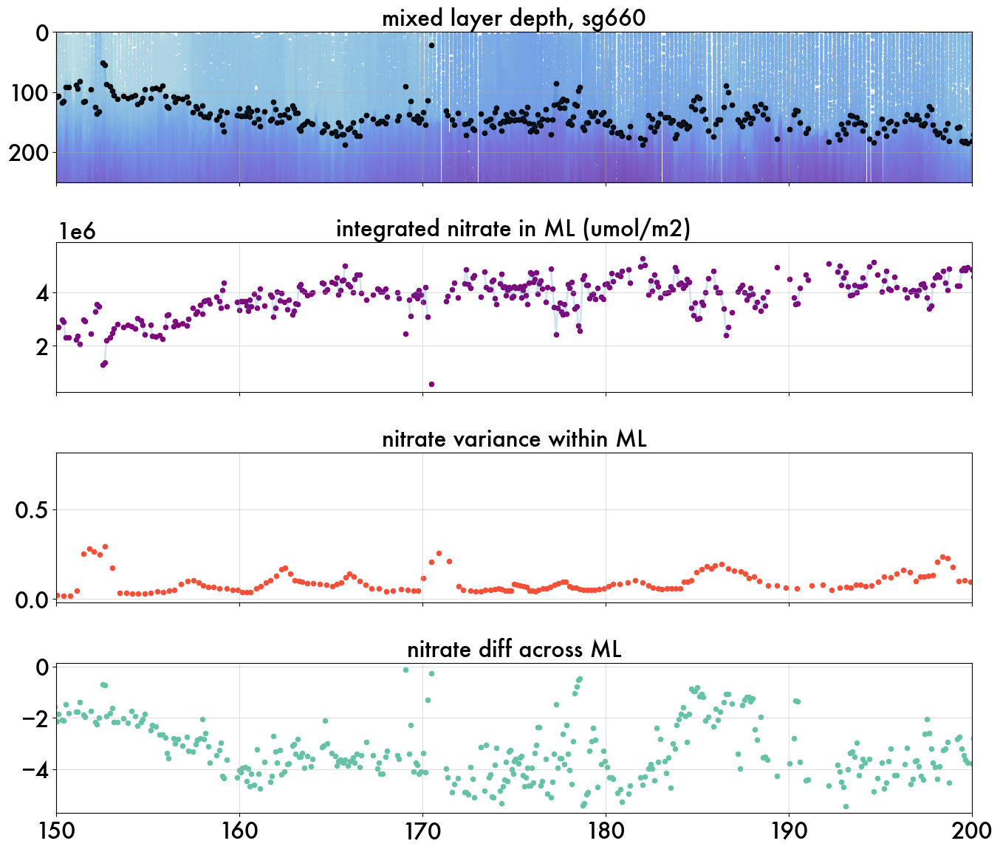

In [ ]:
# Compare ML depth, variable total, and variable variance
fig, axs = plt.subplots(4,1,figsize=(14,12), sharex=True, layout='tight')
axs = axs.flatten()

sca = axs[0].scatter(df_660.yearday, df_660.pressure, c=df_660.sigma0, s=5, cmap=cmo.dense, zorder=1)
axs[0].invert_yaxis()
axs[0].set_ylim([250,0])
# plt.colorbar(sca, ax=axs[0])

twax = axs[0].twinx()
twax.scatter(mlstat_660.yearday, mlstat_660.mld, label='mld', s=20, color='k', zorder=3)
twax.plot(mlstat_660.yearday, mlstat_660.mld, linewidth=2, alpha=0.2, zorder=3)
twax.set_title(('mixed layer depth, sg660'), fontsize=22)
twax.invert_yaxis()
twax.set_ylim([250,0])
twax.set_yticks([])

# axs[0].legend(loc='center')

axs[1].scatter(mlstat_660.yearday, mlstat_660.nitrate_total, label='total', s=20, color=model_palettes['Model_G'])
axs[1].plot(mlstat_660.yearday, mlstat_660.nitrate_total, linewidth=2, alpha=0.2)
axs[1].set_title('integrated nitrate in ML (umol/m2)', fontsize=22)
# axs[1].legend(loc='lower right')

axs[2].scatter(hvariance_660.yearday, hvariance_660.nitrate, label='nitrate var within ML', s=20, color=model_palettes['Model_D'])
# axs[2].plot(mlstat_660.yearday, mlstat_660.nitrate_variance, linewidth=2, alpha=0.2)
# axs[2].legend(loc='upper center')
axs[2].set_title('nitrate variance within ML', fontsize=22)


axs[3].scatter(mlstat_660.yearday, mlstat_660.nitrate_cross, label='cross', s=20, color=model_palettes['Model_A'])
axs[3].set_title('nitrate diff across ML', fontsize=22)

for ax in axs:
    ax.grid(zorder=0, alpha=0.4)
    ax.set_xlim([150,200])
    # ax.legend()

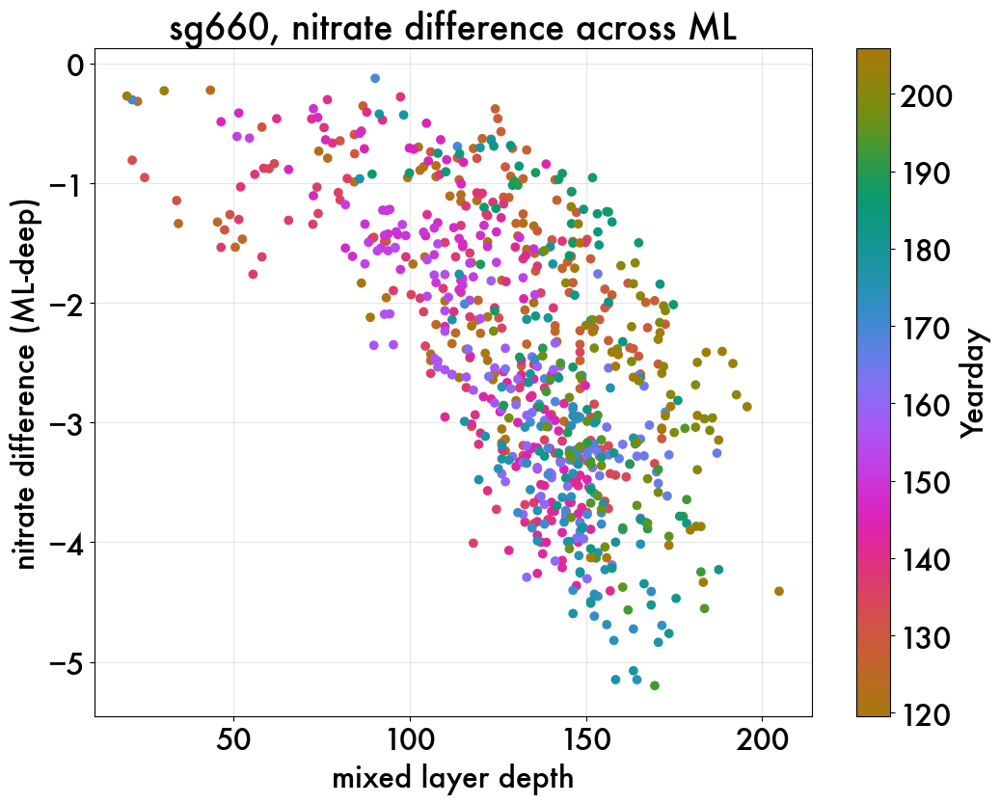

In [ ]:
# Prediction Error as function of observed oxygen 
df = mlstat_660
tag = 'sg660, nitrate difference across ML'


fig = plt.figure(figsize=(12,9))
ax = fig.gca()
plt.scatter(df.mld, df.mlgrad_nitrate, c=df.yearday, cmap=cmo.phase, zorder=3)
# plt.plot([0, 40], [0, 40], 'k--', linewidth=1, alpha=0.3, zorder=0)
cbar = plt.colorbar()
cbar.set_label('Yearday')

ax.set_ylabel('nitrate difference (ML-deep)')
ax.set_xlabel('mixed layer depth')

ax.set_title(tag)
# ax.set_ylim(24, 36.5)
# ax.set_xlim(24, 36.5)
ax.grid(alpha=0.3, zorder=1)


Text(0.5, 1.0, 'gliders')

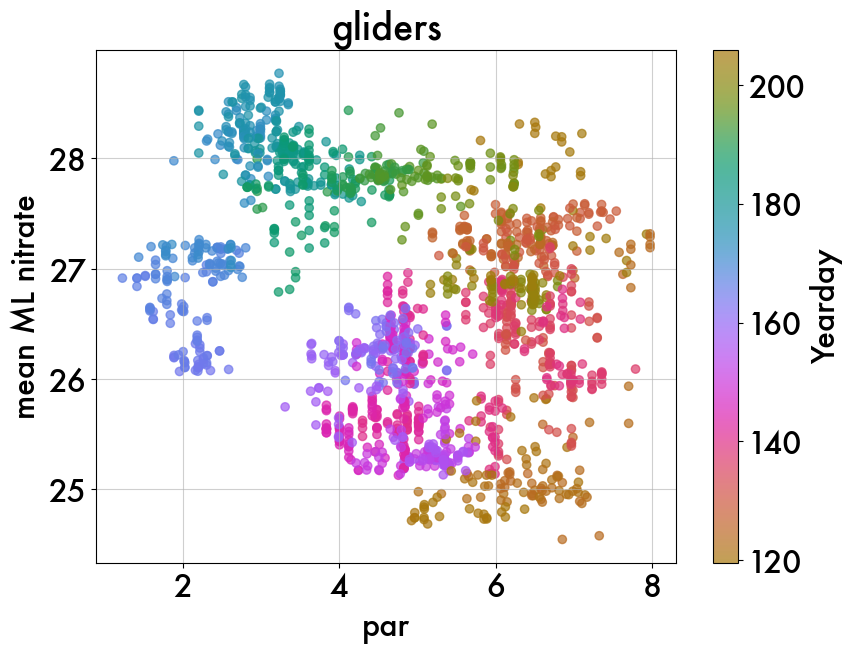

In [ ]:
f = plt.figure(figsize=(9,7), tight_layout=True)
ax = plt.gca()

sca = ax.scatter(dav_660['par'], mlstat_660['nitrate_mean'], c=mlstat_660.yearday, cmap = cmo.phase, alpha=0.7, marker='o', label='sg660')
ax.scatter(dav_659['par'], mlstat_659['nitrate_mean'], c=mlstat_659.yearday, cmap = cmo.phase, alpha=0.7, marker='o', label='sg659')

# sca = ax.scatter(mlstat_660['nitrate_cross'], mlstat_660['nitrate_mean'], c=mlstat_660.yearday, cmap = cmo.phase, alpha=0.6, marker='o', label='sg660')
# ax.scatter(mlstat_659['nitrate_cross'], mlstat_659['nitrate_mean'], c=mlstat_659.yearday, cmap = cmo.phase, alpha=0.6, marker='o', label='sg659')

ax.set_xlabel('par')
ax.set_ylabel('mean ML nitrate')
plt.colorbar(sca).set_label('Yearday')
ax.grid(zorder=1, alpha=0.6)
ax.set_title('gliders')

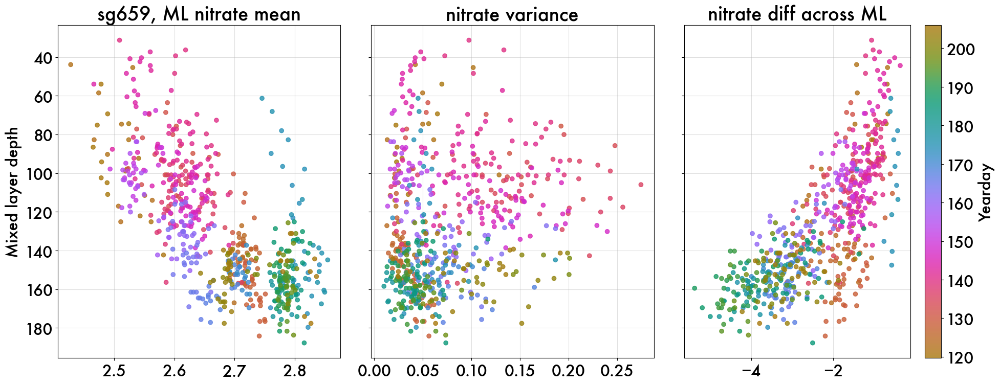

In [ ]:
# Single glider: As fxn of MLD: mean, variance, nitrate diff
# colroed by yearday
df = mlstat_659
tag = 'sg659'


fig, axs = plt.subplots(1,3, figsize=(20,8), layout='tight', sharey=True)
axs = axs.flatten()


axs[0].scatter(df.nitrate_mean, df.mld, c=df.yearday, cmap=cmo.phase, alpha=0.8, zorder=3)
axs[0].set_title('sg659, ML nitrate mean')
# axs[0]


axs[1].scatter(df.nitrate_variance, df.mld, c=df.yearday, cmap=cmo.phase, alpha=0.8, zorder=3)
axs[1].set_title('nitrate variance')

sca = axs[2].scatter(df.mlgrad_nitrate, df.mld, c=df.yearday, cmap=cmo.phase, alpha=0.8, zorder=3)
axs[2].set_title('nitrate diff across ML')

cbar = plt.colorbar(sca, ax=axs[2])
cbar.set_label('Yearday')

axs[0].set_ylabel('Mixed layer depth')

# ax.set_ylim(24, 36.5)
# ax.set_xlim(24, 36.5)
for ax in axs:
    ax.grid(alpha=0.4, zorder=1)
    ax.invert_yaxis()

In [ ]:
mlstat_660

,profid,yearday,lat,lon,mld,par,nitrate_total,nitrate_mean,bbp470_total,bbp470_mean,oxygen_total,oxygen_mean,nitrate_cross,nitrate_underML
0,6600000,119.511892,-51.494672,30.026060,NaN,4.971996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6600001,119.520665,-51.491729,30.030129,NaN,4.971996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6600002,119.545482,-51.483467,30.047711,NaN,5.083996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6600003,119.554456,-51.479121,30.052982,NaN,5.083996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6600004,119.578708,-51.468977,30.070159,NaN,5.083996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999,6601009,205.479899,-51.554193,38.922792,158.4400,6.843998,444.621881,2.806248,-126.919967,-0.801060,5295.507428,33.422794,-0.290956,3.097204
1000,6601010,205.598938,-51.545659,38.944912,163.4880,6.843998,458.788721,2.806253,-131.009473,-0.801340,5463.444021,33.418012,-0.304355,3.110608
1001,6601011,205.699164,-51.540301,38.971168,152.1305,6.287998,425.248577,2.795288,-121.930026,-0.801483,5114.961325,33.622195,-0.313619,3.108908
1002,6601012,205.819367,-51.532005,38.998816,148.3450,6.287998,414.216971,2.792254,-118.783445,-0.800724,4994.255904,33.666493,-0.235665,3.027919


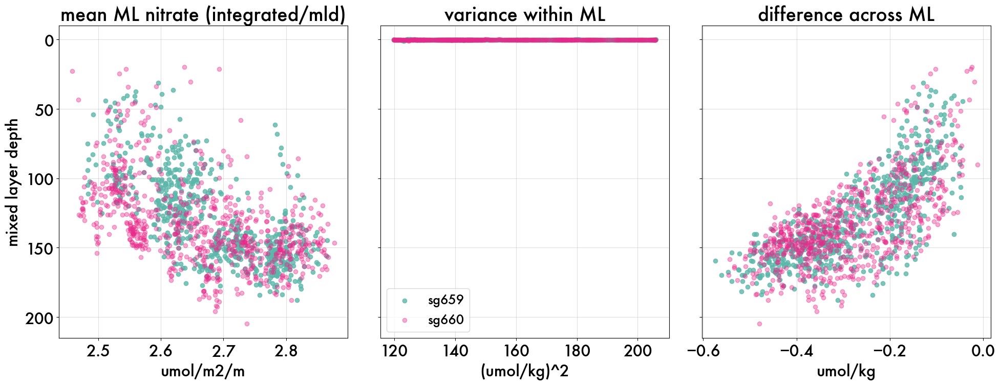

In [ ]:
# Both gliders: As fxn of MLD: mean, variance, nitrate diff
# Colored

fig, axs = plt.subplots(1,3, figsize=(20,8), layout='tight', sharey=True)
axs = axs.flatten()


axs[0].scatter(mlstat_659.nitrate_mean, mlstat_659.mld, color=glid_colors['sg659'], alpha=0.8, zorder=3)
axs[0].scatter(mlstat_660.nitrate_mean, mlstat_660.mld, color=glid_colors['sg660'], alpha=0.4, zorder=3)
axs[0].set_title('mean ML nitrate (integrated/mld)')
# axs[0]


axs[1].scatter(hvariance_659.yearday, hvariance_659.nitrate, color=glid_colors['sg659'], alpha=0.8, zorder=3)
axs[1].scatter(hvariance_660.yearday, hvariance_660.nitrate, color=glid_colors['sg660'], alpha=0.4, zorder=3)
axs[1].set_title('variance within ML')
axs[1].legend(['sg659', 'sg660'], fontsize=18)

sca = axs[2].scatter(mlstat_659.nitrate_cross, mlstat_659.mld, color=glid_colors['sg659'], alpha=0.8, zorder=3)
sca = axs[2].scatter(mlstat_660.nitrate_cross, mlstat_660.mld, color=glid_colors['sg660'], alpha=0.4, zorder=3)
axs[2].set_title('difference across ML')

axs[0].set_xlabel('umol/m2/m')
axs[1].set_xlabel('(umol/kg)^2')
axs[2].set_xlabel('umol/kg')

# cbar = plt.colorbar(sca, ax=axs[2])
# cbar.set_label('Yearday')

axs[0].set_ylabel('mixed layer depth')

# ax.set_ylim(24, 36.5)
# ax.set_xlim(24, 36.5)
for ax in axs:
    ax.grid(alpha=0.4, zorder=1)
    ax.invert_yaxis()

# Outdated: Along-track Analysis

In [483]:
import geopy.distance

In [512]:
# Add cumulative along-track distance
def add_track_distance(dav_plat):
    dav_plat['distance'] = np.tile(np.nan, len(dav_plat))
    list = []
    for ind, prof in enumerate(dav_plat.profid):
        if ind<len(dav_plat)-1:
            la1 = dav_plat.lat.values[ind]
            lo1 = dav_plat.lon.values[ind]
            la2 = dav_plat.lat.values[ind+1]
            lo2 = dav_plat.lon.values[ind+1]
            list.append(geopy.distance.geodesic((la1, lo1), (la2, lo2)).km)

    list = np.cumsum(list)
    # list.append([0]); list= np.sort(list)
    dav_plat.loc[1:, 'distance'] = list
    dav_plat.at[0, 'distance'] = 0

    return dav_plat

In [513]:
# dav_660 = add_track_distance(dav_660)
# dav_659 = add_track_distance(dav_659)
# dav_float = add_track_distance(dav_float)

In [132]:
dav_plat = dav_float
dav_plat['distance'] = np.tile(np.nan, len(dav_plat))
list = []
for ind, prof in enumerate(dav_plat.profid):
    if ind<len(dav_plat)-1:
        la1 = dav_plat.lat.values[ind]
        lo1 = dav_plat.lon.values[ind]
        la2 = dav_plat.lat.values[ind+1]
        lo2 = dav_plat.lon.values[ind+1]
        list.append(geopy.distance.geodesic((la1, lo1), (la2, lo2)).km)

In [136]:
df_660

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,o2sat,mncos,mnsin,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate_G
0,4,119.510598,-51.4952,30.0253,8.070,3.646773,33.958220,327.518402,27.012310,-10.656217,...,320.416311,-0.500000,0.866025,4,6600000,NaN,0.000454,0.000227,0.2074,23.795241
1,5,119.510656,-51.4952,30.0253,9.079,3.631773,33.962220,327.685360,27.016935,-9.863941,...,320.523201,-0.500000,0.866025,4,6600000,NaN,0.000501,0.000227,0.2074,24.082526
2,6,119.510714,-51.4952,30.0254,10.088,3.612773,33.967220,327.686533,27.022739,-10.883128,...,320.658855,-0.500000,0.866025,4,6600000,NaN,0.000471,0.000233,0.2379,24.102845
3,7,119.510772,-51.4951,30.0254,11.097,3.615773,33.965220,327.512713,27.020866,-11.794115,...,320.640409,-0.500000,0.866025,4,6600000,NaN,0.000501,0.000240,0.2684,24.093631
4,8,119.510830,-51.4951,30.0254,12.106,3.612773,33.969220,327.396822,27.024322,-10.664905,...,320.653843,-0.500000,0.866025,4,6600000,NaN,0.000489,0.000223,0.3294,24.096455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
737002,947960,205.873787,-51.5287,39.0112,965.631,2.114773,34.873222,182.046058,27.875646,-12.497102,...,330.396795,-0.866025,-0.500000,7,6601013,NaN,NaN,NaN,NaN,32.223466
737003,947961,205.873700,-51.5287,39.0112,966.645,2.114773,34.874220,182.106957,27.876441,-12.497102,...,330.394220,-0.866025,-0.500000,7,6601013,NaN,NaN,NaN,NaN,32.223297
737004,947963,205.873498,-51.5287,39.0112,968.672,2.114773,34.874220,182.209926,27.876441,-12.494619,...,330.394226,-0.866025,-0.500000,7,6601013,NaN,NaN,NaN,NaN,32.224032
737005,947964,205.873382,-51.5287,39.0112,969.685,2.114773,34.875220,182.221260,27.877237,-12.494619,...,330.391651,-0.866025,-0.500000,7,6601013,NaN,NaN,NaN,NaN,32.193658


In [517]:
mlstat_660 = add_track_distance(mlstat_660)
mlstat_659 = add_track_distance(mlstat_659)
mlstat_float = add_track_distance(mlstat_float)

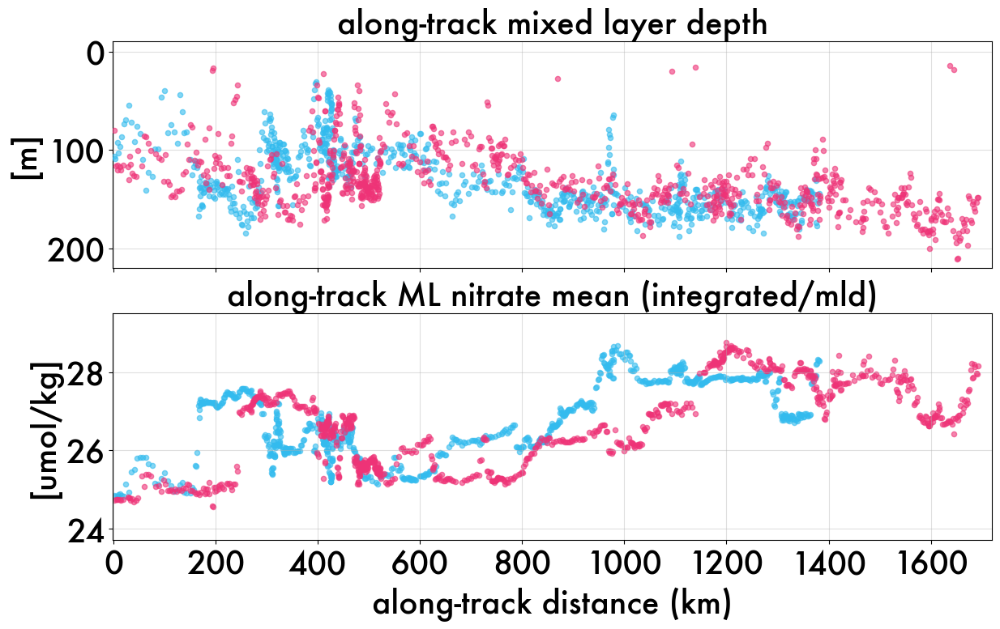

In [529]:
# for figure: nitrate mls tats
# Compare ML depth, variable mean, and variable variance
# BOTH  GLIDER
fig, axs = plt.subplots(2,1,figsize=(14,8), sharex=True) # 14,12
axs = axs.flatten()

# axs[0].scatter(df_659.distance, df_659.pressure, c=df_659.nitrate, s=5, cmap=cmo.deep, zorder=1)
# axs[0].scatter(mlstat_float.distance, mlstat_float.mld, label='float',  marker='D', edgecolors='k', linewidth=2,
#                s=70, alpha=0.8, color='#CCBB44')
axs[0].scatter(mlstat_659.distance, mlstat_659.mld, label='sg659', s=20, alpha=0.6, color=glid_colors['sg659'], zorder=3)
axs[0].scatter(mlstat_660.distance, mlstat_660.mld, label='sg660', s=20, alpha=0.6, color=glid_colors['sg660'], zorder=3)
axs[0].set_ylabel('[m]')
axs[0].invert_yaxis()
axs[0].set_ylim([220, -10])

# axs[0].legend(loc='upper right', fontsize=20, facecolor='w', framealpha=1, markerscale=3)


# axs[1].scatter(mlstat_float.distance, mlstat_float.nitrate_mean, label='float',  marker='D', edgecolors='k', linewidth=2,
#                s=70, alpha=0.8, color='#CCBB44')
axs[1].scatter(mlstat_659.distance, mlstat_659.nitrate_mean, label='sg659', s=20, alpha=0.6, color=glid_colors['sg659'])
axs[1].scatter(mlstat_660.distance, mlstat_660.nitrate_mean, label='sg660', s=20, alpha=0.6, color=glid_colors['sg660'])
axs[1].set_ylabel('[umol/kg]')
axs[1].set_ylim([23.7, 29.5])
axs[1].set_xlabel('along-track distance (km)')

# # Comment out titles
axs[0].set_title(('along-track mixed layer depth'), fontsize=28)
axs[1].set_title('along-track ML nitrate mean (integrated/mld)', fontsize=28)

for ax in axs:
    ax.grid(zorder=0, alpha=0.4)
    ax.set_xlim([-1,1720])
    # ax.legend()
    # ax.vlines(150, -20,250, color='r', linewidth=2, alpha=0.5, linestyle='dashed', zorder=1)
    # ax.vlines(170, -20,250, color='k', linewidth=2, alpha=0.5, linestyle='dashed', zorder=1)


# Other scatter

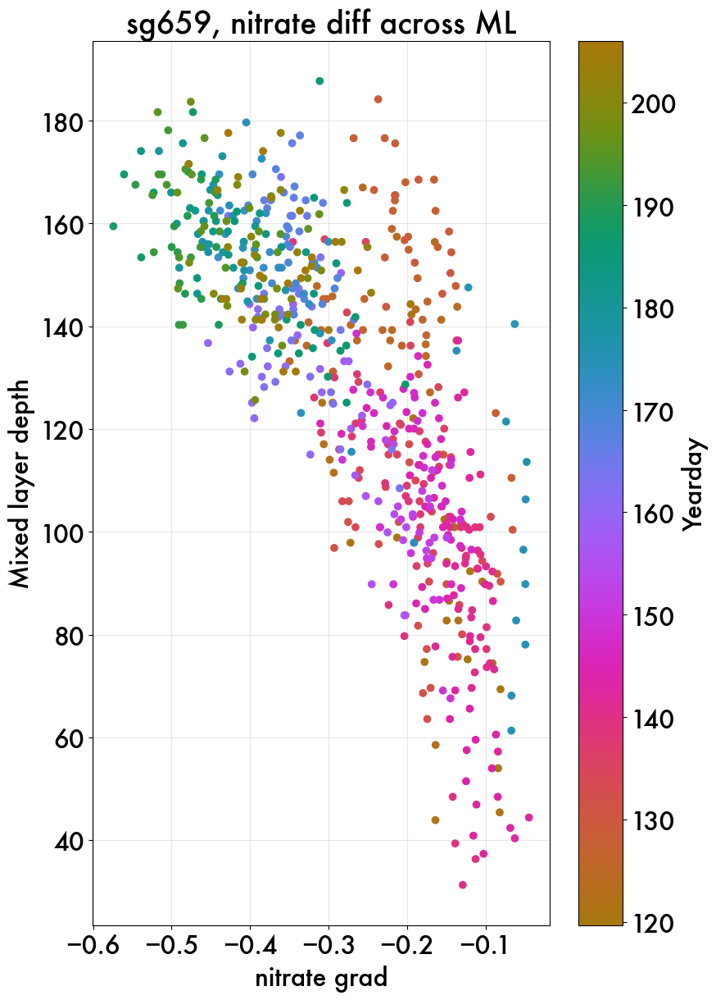

In [ ]:
# nitrate metrics as function of mld
df = mlstat_659
tag = 'sg659, nitrate diff across ML'


fig = plt.figure(figsize=(9,14))
ax = fig.gca()
plt.scatter(df.nitrate_cross, df.mld, c=df.yearday, cmap=cmo.phase, zorder=3)
# plt.plot([0, 40], [0, 40], 'k--', linewidth=1, alpha=0.3, zorder=0)
cbar = plt.colorbar()
cbar.set_label('Yearday')

ax.set_xlabel('nitrate grad')
ax.set_ylabel('Mixed layer depth')

ax.set_title(tag)
# ax.set_ylim(24, 36.5)
# ax.set_xlim(24, 36.5)
ax.grid(alpha=0.3, zorder=1)

# Covariance Matrix

Text(0.5, 1.0, 'Correlation Matrix')

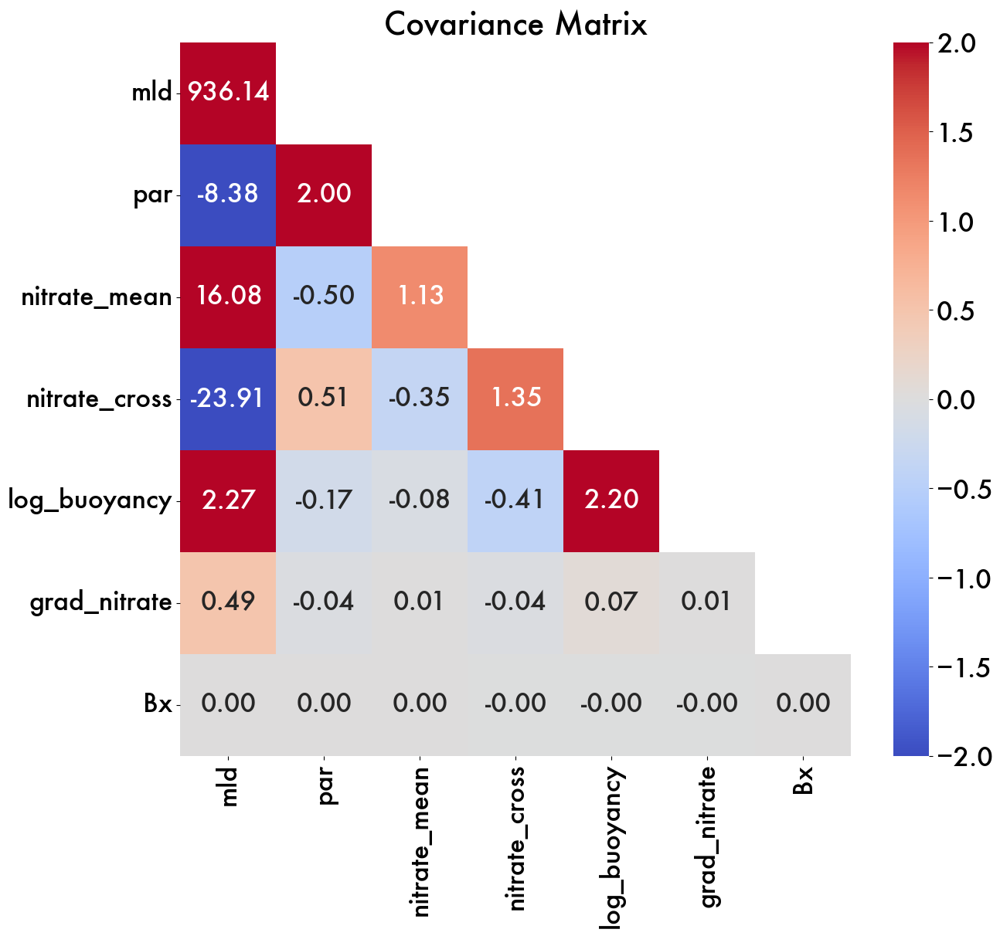

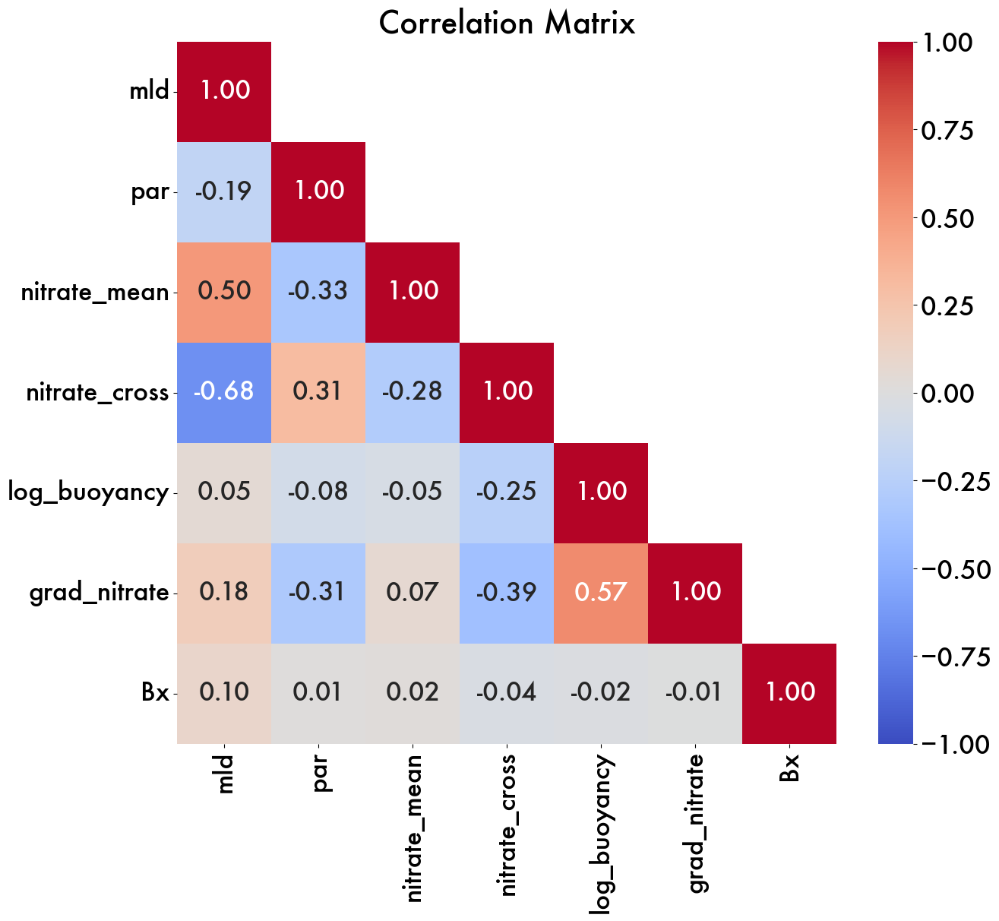

In [ ]:
cols = ['mld', 'par', 'nitrate_mean', 'nitrate_cross', 'log_buoyancy', 'grad_nitrate'] #, 'Bx']
cov_660 = stat_660[cols].cov()
plt.figure(figsize=(14,12))
mask = np.triu(np.ones_like(cov_660, dtype=bool),k=1)
sns.heatmap(cov_660, mask=mask, annot=True, cmap='coolwarm', fmt='.2f', vmin=-2, vmax=2)
plt.title('Covariance Matrix')


corr_660 = stat_660[cols].corr()
plt.figure(figsize=(14,12))
mask = np.triu(np.ones_like(cov_660, dtype=bool),k=1)
sns.heatmap(corr_660, mask=mask, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Matrix')

## Canoncial Correlation Coefficient

In [ ]:
from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import StandardScaler

In [ ]:
baseML_stat

NameError: name 'baseML_stat' is not defined

In [ ]:
X = mlstat_659[['nitrate_mean', 'oxygen_mean', 'nitrate_cross']]
X1 = X.iloc[:, :]
X1_sc = scaler.fit_transform(X1)

## 2D histograms

In [ ]:
stat_659

,profid,yearday,lat,lon,mld,par,nitrate_total,nitrate_mean,bbp470_total,bbp470_mean,oxygen_total,oxygen_mean,nitrate_cross,nitrate_underML,distance,log_buoyancy,grad_nitrate,Bx
0,6590000,119.585031,-51.494618,30.048702,NaN,5.083996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN
1,6590001,119.592706,-51.491504,30.054853,NaN,5.083996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.550020,NaN,NaN,NaN
2,6590002,119.619936,-51.480539,30.077068,106.706000,5.083996,2.650585e+06,24.840077,-8.340709e+05,-7.816532,3.593354e+07,336.752790,NaN,NaN,2.517102,-10.491677,0.000000,NaN
3,6590003,119.631899,-51.475917,30.088078,108.472375,5.665997,2.692738e+06,24.824183,-8.479001e+05,-7.816738,3.640427e+07,335.608632,NaN,NaN,3.438734,-12.012901,0.009669,0.000021
4,6590004,119.689304,-51.449310,30.141417,92.323833,5.087997,2.291708e+06,24.822494,-7.212499e+05,-7.812175,3.098633e+07,335.626550,-1.437041,26.259535,8.182572,-23.659795,0.000000,-0.000194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
907,6590907,205.591044,-51.722662,38.912155,173.587000,6.767998,4.895346e+06,28.201111,-1.386562e+06,-7.987705,5.851148e+07,337.072945,-3.657412,31.858523,1375.936582,-10.648544,0.000000,-0.000253
908,6590908,205.704530,-51.719360,38.927557,177.120750,6.499996,4.999540e+06,28.226730,-1.413923e+06,-7.982821,5.975924e+07,337.392677,-4.216848,32.443578,1377.062593,-10.567804,0.160490,0.000024
909,6590909,205.806132,-51.715944,38.949354,154.404400,6.499996,4.373692e+06,28.326211,-1.233494e+06,-7.988725,5.190869e+07,336.186590,-3.079423,31.405634,1378.616113,-12.557547,0.013351,0.000051
910,6590910,205.921993,-51.710122,38.972913,150.366333,6.303997,4.257118e+06,28.311646,-1.199841e+06,-7.979450,5.063950e+07,336.774174,-2.664803,30.976449,1380.368560,-10.718441,0.030590,-0.000003


In [ ]:
# ml_glids = pd.concat([mlstat_659, mlstat_660])
ml_glids = pd.concat([stat_659, stat_660])

In [ ]:
#2d histograms
x = ml_glids.dropna().par.values
y = ml_glids.dropna().nitrate_mean.values

fig = plt.figure(figsize=(8,7), tight_layout=True)
ax = plt.gca()
ax.hist2d(x,y, bins=(12,12), cmap=cmo.amp)

ax.set_xlabel('par')
ax.set_ylabel('mean ML nitrate (umol/kg)')

NameError: name 'ml_glids' is not defined

Text(0.5, 1.0, 'Correlation Heatmap')

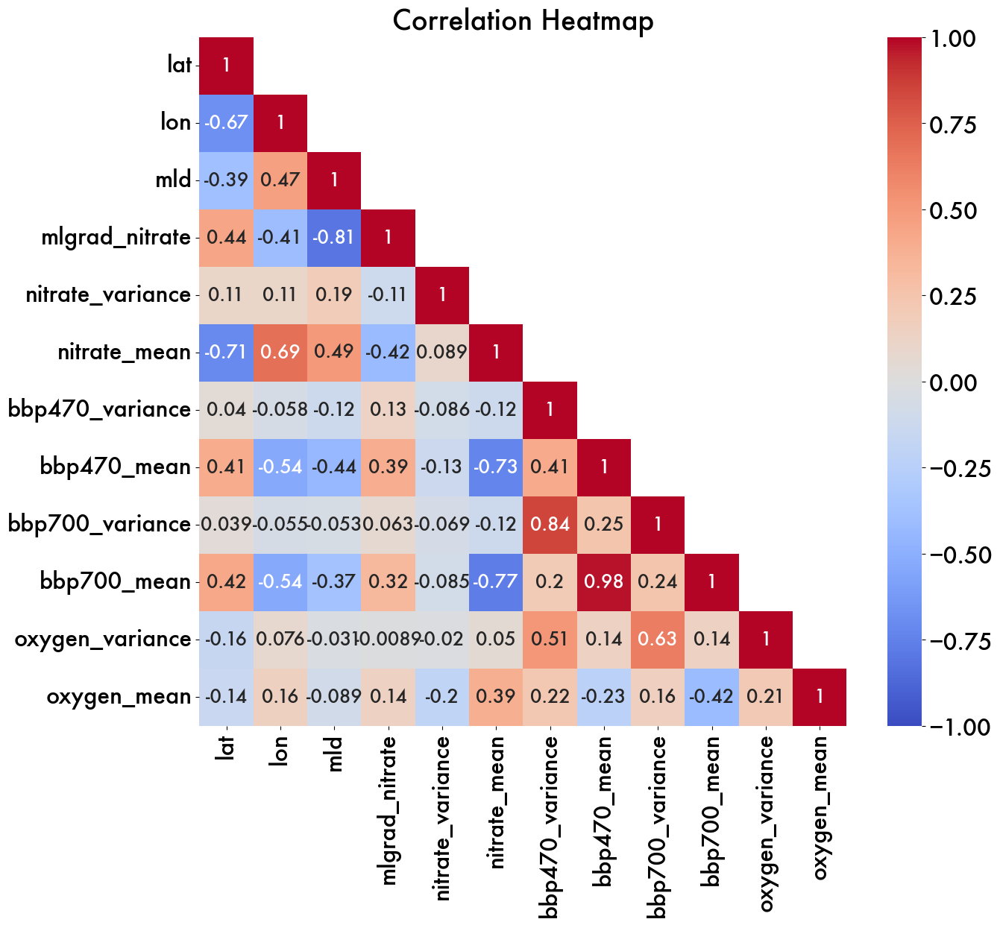

In [ ]:
dfcorr = mlstat_660.drop({'yearday', 'profid'},axis=1).corr()
plt.figure(figsize=(14,12))
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(dfcorr, dtype=bool),k=1)
hm = sns.heatmap(dfcorr, mask=mask, annot=True, cmap='coolwarm', annot_kws={"size": 18}, center=0, vmin=-1, vmax=1)
plt.title('Correlation Heatmap')

<Figure size 1400x1200 with 0 Axes>

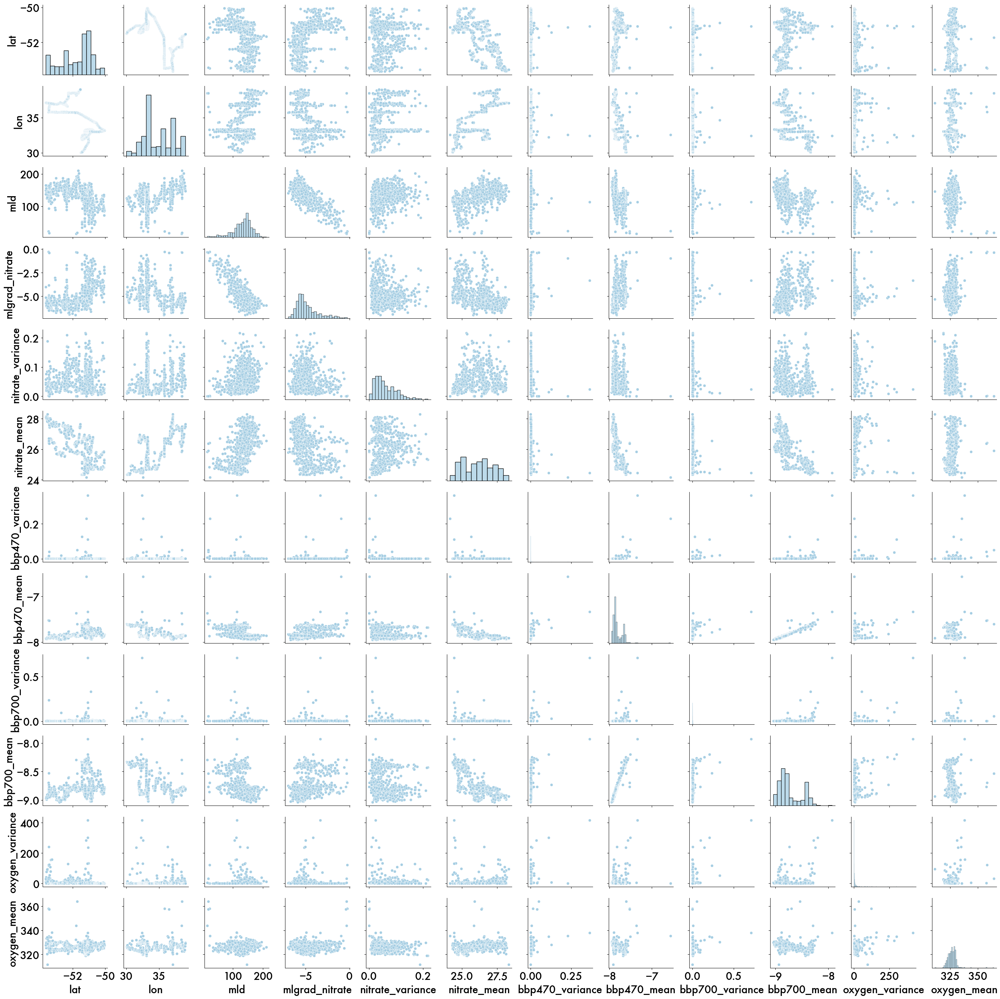

In [ ]:
PWDF = mlstat_660.drop({'yearday', 'profid'},axis=1)
plt.figure(figsize=(14,12))
sns.pairplot(PWDF)

In [ ]:
# T-S Binned

In [ ]:
df_659

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,mnsin,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate_G,AOU,o2persat
0,2,119.583376,-51.4952,30.0472,6.053,3.580758,33.991030,329.153605,26.903886,-12.661607,...,0.866025,4,6590000,NaN,0.000498,0.000221,0.4514,24.247593,-8.304066,1.025881
1,3,119.583405,-51.4952,30.0472,7.062,3.581758,33.992030,329.761488,26.904582,-12.765639,...,0.866025,4,6590000,NaN,0.000492,0.000220,0.4636,24.262415,-8.922269,1.027809
2,7,119.583521,-51.4952,30.0473,11.097,3.582758,33.992030,330.174395,26.904486,-12.483247,...,0.866025,4,6590000,NaN,0.000492,0.000223,0.4636,24.261172,-9.343082,1.029121
3,8,119.583550,-51.4952,30.0473,12.106,3.582758,33.993034,330.180972,26.905281,-13.902866,...,0.866025,4,6590000,NaN,0.000469,0.000243,0.4514,24.266591,-9.352176,1.029150
4,10,119.583666,-51.4951,30.0475,14.123,3.573758,33.992030,330.380022,26.905347,-10.944908,...,0.866025,4,6590000,NaN,0.000489,0.000234,0.5063,24.272033,-9.478499,1.029537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
653303,862034,205.974042,-51.7062,38.9821,957.539,2.163758,34.875034,180.973612,27.730886,-12.060429,...,-0.500000,7,6590911,NaN,NaN,NaN,NaN,32.198749,149.014392,0.548425
653304,862035,205.973926,-51.7062,38.9821,958.553,2.162758,34.876034,181.023786,27.731762,-12.368915,...,-0.500000,7,6590911,NaN,NaN,NaN,NaN,32.154794,148.969888,0.548567
653305,862036,205.973810,-51.7062,38.9821,959.566,2.162758,34.876034,181.070580,27.731762,-12.368983,...,-0.500000,7,6590911,NaN,NaN,NaN,NaN,32.153545,148.923098,0.548709
653306,862037,205.973694,-51.7062,38.9821,960.580,2.161758,34.877033,181.114731,27.732639,-12.368983,...,-0.500000,7,6590911,NaN,NaN,NaN,NaN,32.143275,148.884618,0.548834


In [ ]:
mldf_659

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate_G,AOU,o2persat,mld
0,98,119.616270,-51.4817,30.0739,4.035,3.565758,33.985030,330.053918,26.900568,-12.977491,...,4,6590002,NaN,0.000469,0.000200,0.4636,24.228762,-9.072253,1.028264,104.940
1,99,119.616328,-51.4817,30.0739,5.044,3.565758,33.986034,330.290852,26.901363,-12.977491,...,4,6590002,NaN,0.000457,0.000190,0.4697,24.234299,-9.311710,1.029010,104.940
2,100,119.616357,-51.4817,30.0739,6.053,3.565758,33.986034,330.425390,26.901363,-15.191113,...,4,6590002,NaN,0.000445,0.000180,0.4758,24.234563,-9.446274,1.029430,104.940
3,101,119.616385,-51.4817,30.0740,7.062,3.564758,33.986034,330.587267,26.901458,-12.440718,...,4,6590002,NaN,0.000492,0.000213,0.5246,24.230298,-9.600366,1.029909,104.940
4,102,119.616414,-51.4817,30.0740,8.070,3.563758,33.987034,330.744297,26.902345,-11.236404,...,4,6590002,NaN,0.000475,0.000216,0.4758,24.226516,-9.752096,1.030381,104.940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47507,861225,206.065014,-51.7020,38.9939,139.262,1.799758,34.098034,324.583938,27.139991,-10.434721,...,7,6590911,NaN,0.000363,0.000110,0.1464,28.181688,10.448544,0.968813,144.309
47508,861226,206.064898,-51.7020,38.9939,140.271,1.796758,34.101032,324.048930,27.142603,-11.141427,...,7,6590911,NaN,0.000363,0.000120,0.1342,28.205592,11.001048,0.967166,144.309
47509,861227,206.064782,-51.7021,38.9939,141.280,1.797758,34.102030,323.554817,27.143326,-10.872650,...,7,6590911,NaN,0.000363,0.000110,0.1464,28.211572,11.484143,0.965723,144.309
47510,861228,206.064667,-51.7021,38.9939,142.290,1.796758,34.106033,323.131232,27.146590,-10.455206,...,7,6590911,NaN,0.000363,0.000120,0.1464,28.246569,11.905724,0.964464,144.309


(33.92, 34.24)

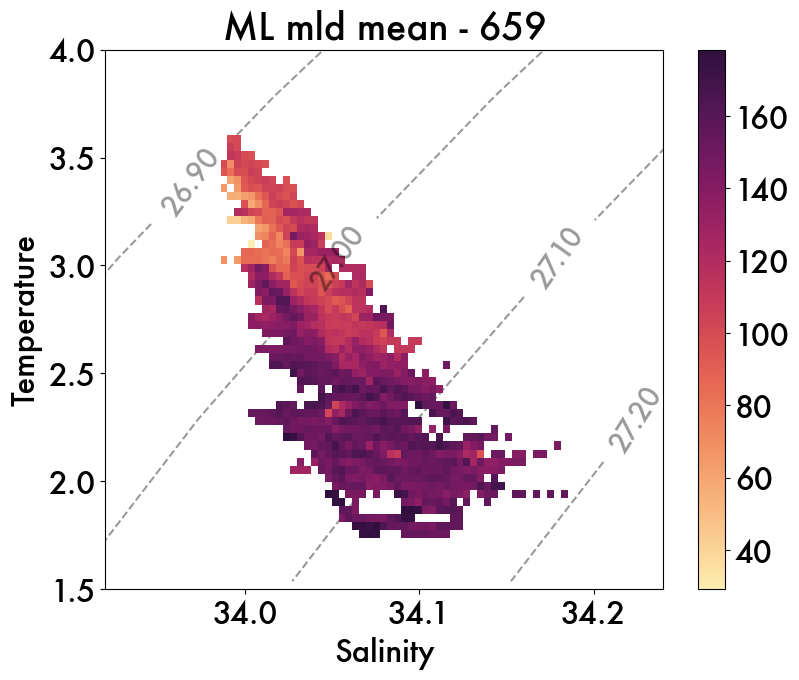

In [ ]:
# Restricted to upper ML only

df = mldf_659[mldf_659.yearday>125]
nbins = 50
[bin_temp, bin_sal] = dfproc.TSbin(df, nbins)

df = dfproc.coords_TSbin(df, nbins)
arr = dfproc.array_TSbin(df, nbins, var='nitrate_G', stat='mean')

fig = plt.figure(figsize=(9,7))
ax = fig.gca()

im = plt.pcolormesh(bin_sal, bin_temp, arr, cmap=cmo.matter, zorder=3)
ax.set_xlabel('Salinity')
ax.set_ylabel('Temperature')
ax.set_title('ML nitrate mean - 659')
# ax.grid(alpha=0.3, zorder=1)
plt.colorbar(im, ax=ax)


# Add density contours
# Figure out boudaries (mins and maxs)
smin = df.SA.min() -.2
smax = df.SA.max() +.2

tmin= df.CT.min() - 1.2
tmax = df.CT.max() + 0.5

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin

# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.sigma0(si[i],ti[j])

CS = ax.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.4, zorder=1)
ax.clabel(CS, fontsize=20, fmt='%1.2f')
ax.set_ylim(1.5,4.0)
ax.set_xlim(33.92, 34.24)




In [ ]:
from scipy.ndimage import gaussian_filter

# delta = 0.025
# x = np.arange(-3.0, 3.0, delta)
# y = np.arange(-2.0, 2.0, delta)
# X, Y = np.meshgrid(x, y)
# Z = mlab.bivariate_normal(X, Y, 1.0, 1.0, 0.0, 0.0)
# Z += 0.1*np.random.random(Z.shape)

# plt.figure()
# plt.pcolormesh(X, Y, Z)

# CS = plt.contour(X, Y, gaussian_filter(Z, 5.), 4, colors='k',interpolation='none')
# plt.colorbar()
# plt.show()

(33.75, 35.05)

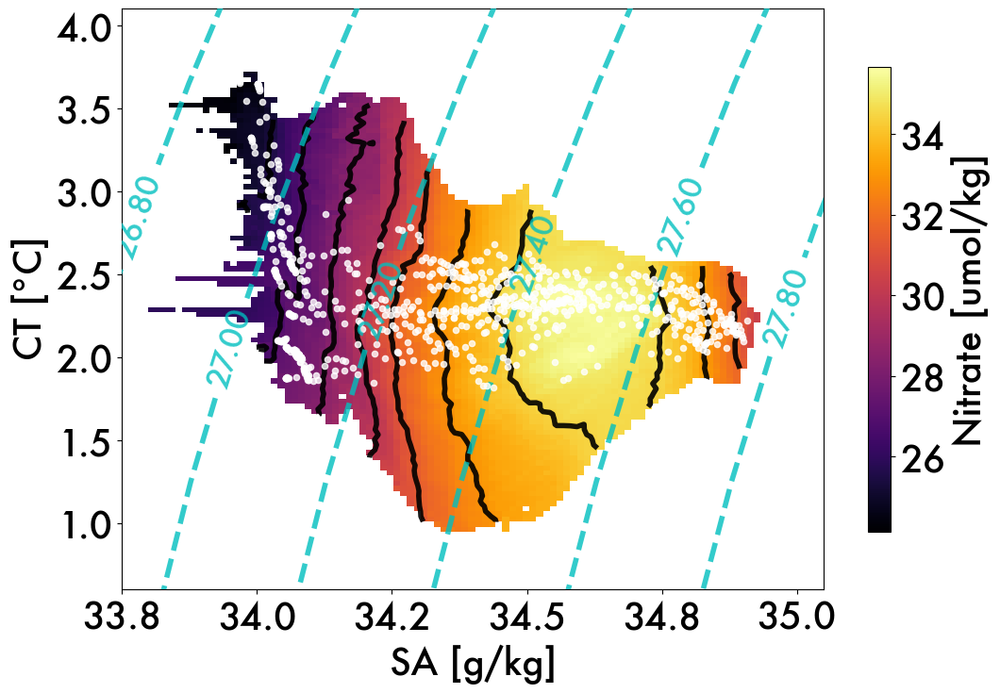

In [369]:
# Full depth -- TRY WITH BOTH GLIDERS CMOMBINED

df = pd.concat([df_660, df_659])
df = df[df.yearday>120]

# type='variance'; pal='magma'
type='mean'; pal='inferno'
# type='count'; pal='OrRd'

# Comment out this section to speed up
# nbins = 90
# [bin_temp, bin_sal] = dfproc.TSbin(df, nbins)

# df = dfproc.coords_TSbin(df, nbins)
# arr = dfproc.array_TSbin(df, nbins, var='nitrate', stat=type)
# if type == 'count':
#     arr=np.log(arr)

# Plotting part
fig = plt.figure(figsize=(12,8)) #12,8 for slides
# fig = plt.figure(figsize=(10,6))

ax = fig.gca()
im = plt.pcolormesh(bin_sal, bin_temp, arr, cmap=pal, zorder=3) 
plt.colorbar(im, ax=ax, orientation='vertical', shrink=0.8).set_label('Nitrate [umol/kg]')


# Contour the variable
vCS = ax.contour(bin_sal[:-1], bin_temp[:-1], arr, linewidths=4, colors='k', alpha=0.9, zorder=3)
# ax.clabel(vCS, fontsize=24, fmt='%1.2f')

ax.set_xlabel('SA [g/kg]')
ax.set_ylabel('CT [$\degree$C]')
# ax.set_title('T-S binned nitrate ' + type)
ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
# ax.grid(alpha=0.3, zorder=1)



[si, ti, dens] = dfproc.TS_contours(df, nbins=nbins, type='density')
CS = ax.contour(si,ti,dens, linestyles='dashed', linewidths=4, colors='c', alpha=0.8, zorder=3)
ax.clabel(CS, fontsize=24, fmt='%1.2f')

# labels = ['26.8', '27.0', '27.2', '27.4', '27.6', '27.8', '28.0']
# for i in range(len(labels)): 
#   CS.collections[i].set_label(labels[i])
# ax.legend()

# [si, ti, spiciness] = dfproc.TS_contours(df, nbins=nbins, type='spice')
# CS = ax.contour(si,ti,spiciness, linestyles='dotted', linewidths=3, colors='m', alpha=0.4, zorder=3)
# # ax.clabel(CS, fontsize=24, fmt='%1.2f')

# Try adding float points
float = RF_pred_6030
float = float[(float.yearday>120) & (float.yearday<200)]
ax.scatter(float.SA, float.CT, c='w', alpha=0.8, s=20, zorder=3)

ax.set_ylim(0.6,4.1)
ax.set_xlim(33.75, 35.05)


In [ ]:
importlib.reload(dfproc)

<module 'sgmod_DFproc' from '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/scripts/sgmod_DFproc.py'>

(33.75, 35.05)

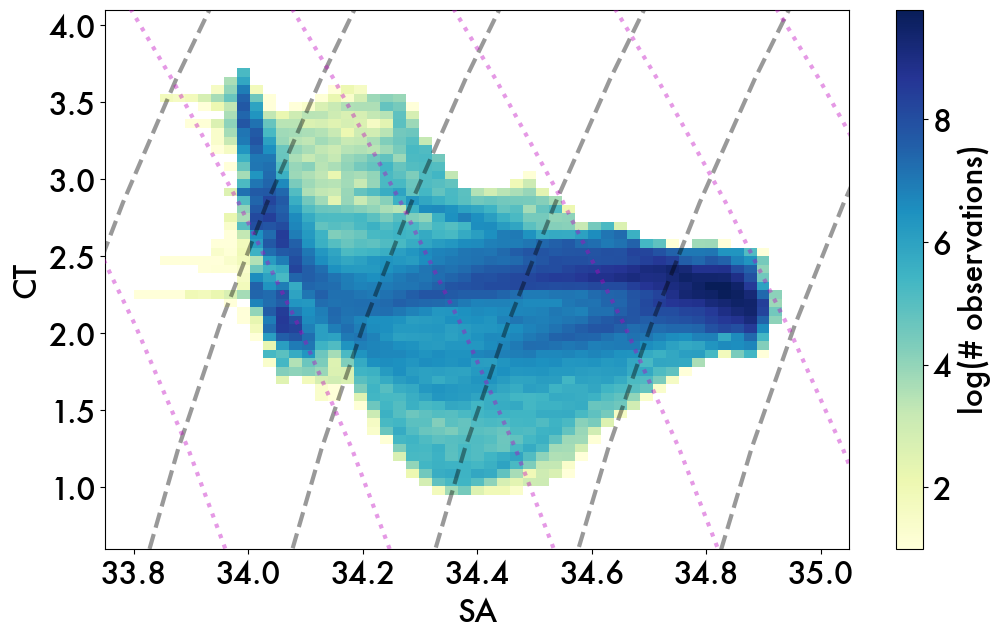

In [ ]:
# T-S COUNTS -- TRY WITH BOTH GLIDERS CMOMBINED
df = pd.concat([df_660, df_659])
df = df[df.yearday>120]

# nbins = 50
# [bin_temp, bin_sal] = dfproc.TSbin(df, nbins)
# coordf = dfproc.coords_TSbin(df, nbins)
# arr = dfproc.array_TSbin(coordf, nbins, var='nitrate', stat='count')
# arr=np.log(arr)

# Comment out above for quicker
fig = plt.figure(figsize=(12,7))
ax = fig.gca()

im = plt.pcolormesh(bin_sal, bin_temp, arr, cmap= 'YlGnBu', zorder=3, vmin=1) #YlGnBu'
ax.set_xlabel('SA')
ax.set_ylabel('CT')

ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.colorbar(im, ax=ax).set_label('log(# observations)')

[si, ti, dens] = dfproc.TS_contours(df, nbins=nbins, type='density')
CS = ax.contour(si,ti,dens, linestyles='dashed', linewidths=3, colors='k', alpha=0.4, zorder=3)

[si, ti, spiciness] = dfproc.TS_contours(df, nbins=nbins, type='spice')
CS = ax.contour(si,ti,spiciness, linestyles='dotted', linewidths=3, colors='m', alpha=0.4, zorder=3)

# ax.clabel(CS, fontsize=20, fmt='%1.2f', inline=1)

ax.set_ylim(0.6,4.1)
ax.set_xlim(33.75, 35.05)

# # Try adding float points
# float = RF_pred_6030
# float = float[(float.yearday>120) & (float.yearday<200)]
# ax.scatter(float.SA, float.CT, c='r', alpha=0.7, s=30, zorder=3)

# OUTDATED

In [ ]:
importlib.reload(dfproc)

<module 'sgmod_DFproc' from '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/scripts/sgmod_DFproc.py'>

In [ ]:
dav_659 = dfproc.make_diveav(df_659) # from 7 to 13

number of profiles with no 10m data:  34
approx # of obs within profile that were averaged for final mlp:  5.55360824742268
number of nan mlds even where 10m exists:  73


In [ ]:
dav_659 = dfproc.make_diveav(df_659) # from 5 to 15 dbar

number of profiles with no 10m data:  34
approx # of obs within profile that were averaged for final mlp:  5.55360824742268
number of nan mlds even where 10m exists:  73


In [ ]:
dav_660 = dfproc.make_diveav(df_660)

number of profiles with no 10m data:  81
approx # of obs within profile that were averaged for final mlp:  2.1917659804983747


In [ ]:
temp = pd.read_csv('/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/glider/dav_659_fin24.csv')

In [ ]:
len(sg.list_profile_DFs(temp))

912

In [ ]:
# Make new dataframe that is only the upper DF in the mixed layer 

# now in dfproc
# mldf_659 = pd.DataFrame()

# for i, prof in enumerate(dfproc.list_profile_DFs(df_659)):
#     mlp = dav_659.mld[i]
#     if mlp != np.nan:
#         upperprof = prof[prof.pressure<mlp].copy()

#         mlp_array = np.tile(mlp, upperprof.shape[0])
#         upperprof['mld'] = mlp_array
#         mldf_659 = pd.concat([mldf_659, upperprof], ignore_index=True)

mldf_659 = dfproc.make_mldf(df_659, dav_659)

,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,spice,...,mncos,mnsin,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate_G,mld
0,119.616270,-51.4817,30.0739,4.035,3.565758,33.985030,330.053918,26.900568,-12.977491,-0.534645,...,-0.500000,0.866025,4,6590002,NaN,0.000469,0.000200,0.4636,24.152435,104.940
1,119.616328,-51.4817,30.0739,5.044,3.565758,33.986034,330.290852,26.901363,-12.977491,-0.533936,...,-0.500000,0.866025,4,6590002,NaN,0.000457,0.000190,0.4697,24.154595,104.940
2,119.616357,-51.4817,30.0739,6.053,3.565758,33.986034,330.425390,26.901363,-15.191113,-0.533936,...,-0.500000,0.866025,4,6590002,NaN,0.000445,0.000180,0.4758,24.154742,104.940
3,119.616385,-51.4817,30.0740,7.062,3.564758,33.986034,330.587267,26.901458,-12.440718,-0.534042,...,-0.500000,0.866025,4,6590002,NaN,0.000492,0.000213,0.5246,24.153960,104.940
4,119.616414,-51.4817,30.0740,8.070,3.563758,33.987034,330.744297,26.902345,-11.236404,-0.533441,...,-0.500000,0.866025,4,6590002,NaN,0.000475,0.000216,0.4758,24.151830,104.940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46593,206.065014,-51.7020,38.9939,139.262,1.799758,34.098034,324.583938,27.139991,-10.434721,-0.621782,...,-0.866025,-0.500000,7,6590911,NaN,0.000363,0.000110,0.1464,28.013817,144.309
46594,206.064898,-51.7020,38.9939,140.271,1.796758,34.101032,324.048930,27.142603,-11.141427,-0.619929,...,-0.866025,-0.500000,7,6590911,NaN,0.000363,0.000120,0.1342,28.089606,144.309
46595,206.064782,-51.7021,38.9939,141.280,1.797758,34.102030,323.554817,27.143326,-10.872650,-0.619146,...,-0.866025,-0.500000,7,6590911,NaN,0.000363,0.000110,0.1464,28.106280,144.309
46596,206.064667,-51.7021,38.9939,142.290,1.796758,34.106033,323.131232,27.146590,-10.455206,-0.616424,...,-0.866025,-0.500000,7,6590911,NaN,0.000363,0.000120,0.1464,28.159023,144.309


In [ ]:
nitrate_variance = []
mlpres = []
for prof in dfproc.list_profile_DFs(mldf_659):
    nitrate_variance.append(np.std(prof.nitrate_G))
    mlpres.append(prof.mld.mean())
nitrate_variance

[0.09848078691261018,
 0.11487833957309397,
 0.1051250345358102,
 0.11846076340140953,
 0.12185091045700784,
 0.1079588292703983,
 0.16362988242031207,
 0.1632790932337243,
 0.28268706122987025,
 0.2275748244040579,
 0.20490237502660086,
 0.2786992247278719,
 0.1692528024319526,
 0.17307103672487772,
 0.1191949995972077,
 0.267868272806021,
 0.24507364460642347,
 0.18796303086978278,
 0.1474224910244779,
 0.10362655199896308,
 0.17178699060268998,
 0.14930821366532152,
 0.11204975768793025,
 0.13155926671527624,
 0.1611756878256817,
 0.08477269693176528,
 0.12278457328929006,
 0.15405754991372397,
 0.25437436050647416,
 0.2685994042474995,
 0.25648674650185416,
 0.10516561142999757,
 0.22168392944595142,
 0.22894930508031175,
 0.28217977546125683,
 0.18768459118165787,
 0.2225643367902136,
 0.20694145654383572,
 0.2037341781978109,
 0.24718290502059362,
 0.22193420439996453,
 0.21445419224964726,
 0.22131775083854027,
 0.17160213163422583,
 0.25363783731491685,
 0.24042243793193216,
 0

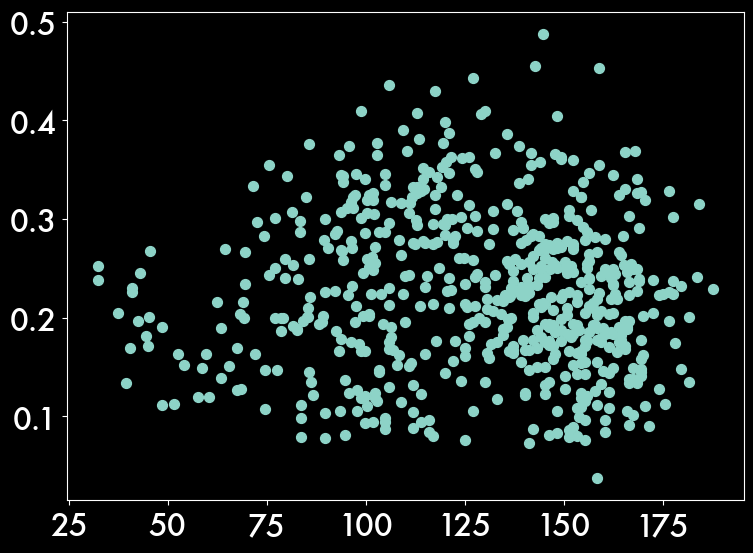

In [ ]:
fig = plt.figure(figsize=(8,6), layout='tight')
ax = fig.gca()

ax.scatter(mlpres, nitrate_variance, s=50) #, vmin=1.5, vmax=3.6) #, marker='s')

(200.0, 0.0)

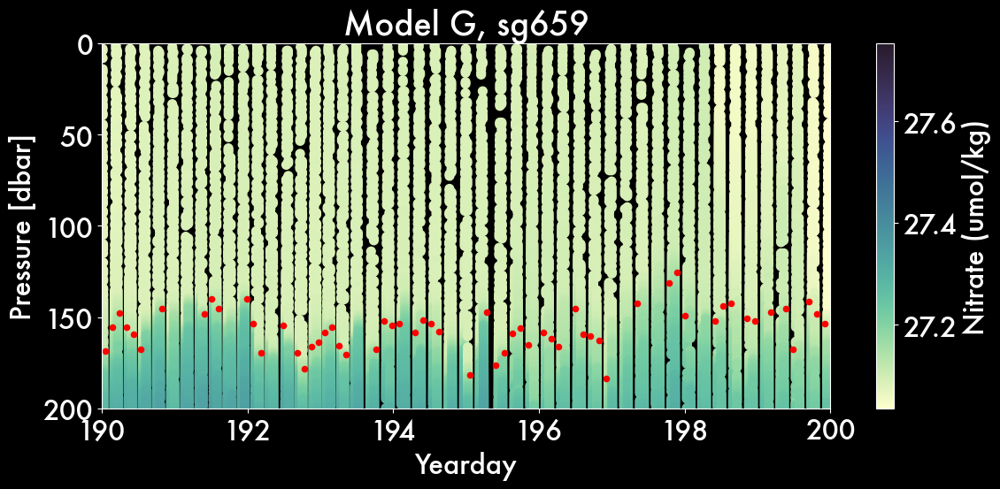

In [ ]:
# * Preidction, Obs, and Error Profiles
minday = 190
maxday = 200

dat = df_659[(df_659.yearday <maxday) & (df_659.yearday > minday)]
tag = 'Model G, sg659'


fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.sigma0, cmap=cmo.deep, s=50) #, vmin=1.5, vmax=3.6) #, marker='s')
ax.set_title(tag )

ax.scatter(dav_659.yearday, dav_659.mld, color='r', s=20)

plt.colorbar(sca, ax=ax).set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure [dbar]')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([200,0])



In [ ]:
dav_659.to_csv('../working-vars/glider/mld_659_1101.csv')
dav_660.to_csv('../working-vars/glider/mld_660_1101.csv')

# OUTDATED: Integrated ML nitrate concentrations

In [ ]:
floatDF_full = pd.read_csv('../working-vars/RF-training/mldata_floatDF_full_dec2023.csv')

In [ ]:
importlib.reload(dfproc)

<module 'sgmod_DFproc' from '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/scripts/sgmod_DFproc.py'>

In [ ]:
sogos_float = floatDF_full[floatDF_full.wmoid==5906030].copy()
dav_6030 = dfproc.make_diveav(sogos_float, thresh=0.025)
dav_6030

number of profiles with no 10m data:  0
approx # of obs within profile that were averaged for final mlp:  2.619047619047619


,profid,yearday,lat,lon,mld
0,5906030000,120.374294,-51.355,30.208,111.146667
1,5906030001,125.159699,-51.074,32.828,90.886666
2,5906030003,135.173252,-52.452,31.764,86.583330
3,5906030004,140.063449,-51.856,33.445,70.994286
4,5906030005,145.180833,-51.417,34.669,76.725000
...,...,...,...,...,...
58,5906030059,650.545949,-57.037,63.757,186.150000
59,5906030060,660.873565,-57.064,64.008,176.889997
60,5906030061,671.160359,-57.102,64.260,186.864995
61,5906030062,681.567778,-57.315,64.442,186.270000


In [ ]:
sogos_float = floatDF[floatDF.wmoid==5906030].copy()
sogos_float['prediction'] = RF_pred_6030['Model_G'].values

In [ ]:
def make_mlstats_float(df_plat, dav_plat, variable='nitrate'):
    """ 
    @param:    df_plat:   dataframe of plater data
                dav_plat:  dataframe of dive-averaged data
                variable: either nitrate (using SOGOS observation) or 'prediction' for RF, CANYON, ESPER
    @return:    mldf: dataframe of plater data with only upper mixed layer data
                mlstats: add on new variables to dav
    """
    # Store upper ML observations into a separate DF
    mldf_plat = pd.DataFrame()


    # Store dive ave data with new metrics
    mlstats = dav_plat.copy()
    ml_varlist = ['nitrate_variance', 'nitrate_mean', 
              'oxygen_variance', 'oxygen_mean']
    for var in ml_varlist:
        mlstats[var] = np.tile(np.nan, mlstats.shape[0])


    for i, prof in enumerate(dfproc.list_profile_DFs(df_plat)):
        # values that are the same for whole profile
        mlp = mlstats.mld[i]

        # Now store all the mldata observations in mldf
        if mlp != np.nan:
            # Cut off all the data below the mixed layer
            # Create an array containing mld for each row
            upperprof = prof[prof.pressure<mlp].copy()
            mlp_array = np.tile(mlp, upperprof.shape[0])
            upperprof['mld'] = mlp_array

            mldf_plat = pd.concat([mldf_plat, upperprof], ignore_index=True)

            # now make the mlstats, which just adds upon dav_plat 
            mlstats.loc[i,'nitrate_variance'] = np.var(upperprof[variable])
            mlstats.loc[i,'nitrate_mean'] = np.mean(upperprof[variable])

            mlstats.loc[i,'oxygen_variance'] = np.var(upperprof.oxygen)
            mlstats.loc[i,'oxygen_mean'] = np.mean(upperprof.oxygen)

    return mldf_plat, mlstats

In [ ]:
def mlsum_nitrate(mldf, variable='nitrate'):
    
    prof_list = dfproc.list_profile_DFs(mldf)

    profsum = pd.DataFrame()
    # profsum_nitrate = []

    for i, prof in enumerate(prof_list):
        prof = prof.sort_values(by='pressure')
        sum = np.trapz(prof[variable], prof.pressure)
        profsum.loc[i,'profid'] = prof.profid.values[0]
        profsum.loc[i, 'yearday'] = prof.yearday.values[0]
        profsum.loc[i, 'mld'] = prof.mld.values[0]
        profsum.loc[i, 'variable'] = sum
        profsum.loc[i, 'nobs'] = len(prof)

    profsum['ave_concentration'] = profsum.variable.values / profsum.nobs.values

    mlsum_nitrate = np.sum(profsum.variable)
    print('Total ML integrated nitrate: ' + str(mlsum_nitrate))

    return profsum

In [ ]:
for var in ['profid', 'CT', 'SA', 'oxygen', 'sigma0', 'spice']:
    CANYON_pred[var] = sogos_float[var].values
    ESPER_pred[var] = sogos_float[var].values

In [ ]:
mldf_6030

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,o2sat,mncos,mnsin,month,nitrate,wmoid,profid,dist_maxb,prediction,mld
0,27323,120.374294,-51.355,30.208,33.059998,3.646815,34.001027,326.35095,26.900994,-19.750025,...,320.309034,-0.866025,0.5,5,24.327644,5906030,5906030000,117.879992,24.408469,111.146667
1,27324,120.374294,-51.355,30.208,35.230000,3.646676,34.001041,326.34912,26.901019,-15.410772,...,320.310085,-0.866025,0.5,5,24.310630,5906030,5906030000,115.709990,24.408093,111.146667
2,27325,120.374294,-51.355,30.208,36.670000,3.646283,34.001036,326.32490,26.901053,-15.336909,...,320.313152,-0.866025,0.5,5,24.337334,5906030,5906030000,114.269990,24.409034,111.146667
3,27328,120.374294,-51.355,30.208,46.730000,3.648244,34.001074,326.13754,26.900892,-13.446538,...,320.297846,-0.866025,0.5,5,24.227932,5906030,5906030000,104.209990,24.424141,111.146667
4,27329,120.374294,-51.355,30.208,52.360000,3.639289,34.002073,326.04580,26.902555,-13.096893,...,320.365141,-0.866025,0.5,5,24.203530,5906030,5906030000,98.579990,24.427613,111.146667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
813,30923,691.905764,-57.596,64.892,121.700000,0.604318,34.108267,337.54660,27.225447,-13.142750,...,345.364969,0.866025,-0.5,11,28.888432,5906030,5906030063,127.680000,28.675224,161.362861
814,30924,691.905764,-57.596,64.892,131.590010,0.578824,34.109414,337.37988,27.227871,-13.073832,...,345.589260,0.866025,-0.5,11,28.905872,5906030,5906030063,117.789990,28.786548,161.362861
815,30925,691.905764,-57.596,64.892,142.080000,0.563999,34.110577,335.85437,27.229674,-13.013275,...,345.718649,0.866025,-0.5,11,28.883326,5906030,5906030063,107.300000,28.903573,161.362861
816,30926,691.905764,-57.596,64.892,151.130000,0.558720,34.113717,333.90555,27.232498,-12.417699,...,345.757555,0.866025,-0.5,11,29.064564,5906030,5906030063,98.250000,28.949296,161.362861


In [ ]:
mldf_6030, mlstats_6030 = make_mlstats_float(sogos_float, dav_6030, variable='nitrate')
mldf_RF, mlstats_RF = make_mlstats_float(sogos_float, dav_6030, variable='prediction') # RF prediction
mldf_CANYON, mlstats_CANYON = make_mlstats_float(CANYON_pred, dav_6030, variable='prediction')
mldf_ESPER, mlstats_ESPER = make_mlstats_float(ESPER_pred, dav_6030, variable='prediction')

In [ ]:
profsum_6030 = mlsum_nitrate(mldf_6030)

Total ML integrated nitrate: 166814.48766809626


In [ ]:
profsum_RF = mlsum_nitrate(mldf_RF, variable='prediction')

Total ML integrated nitrate: 166332.31088201187


In [ ]:
profsum_CANYON  = mlsum_nitrate(mldf_CANYON, variable='prediction')

Total ML integrated nitrate: 156986.6775300724


In [ ]:
profsum_ESPER = mlsum_nitrate(mldf_ESPER, variable='prediction')

Total ML integrated nitrate: 153684.96241609397


In [ ]:
integrated_ML = pd.DataFrame()
integrated_ML['model'] = ['SOGOS', 'RF', 'CANYON', 'ESPER']
integrated_ML['ave_ML_nitrate'] = [profsum_6030.ave_concentration.mean(), profsum_RF.ave_concentration.mean(),
                                   profsum_CANYON.ave_concentration.mean(), profsum_ESPER.ave_concentration.mean()]


# [166814.48766809626,
# 166332.31088201187,
# 156986.6775300724,
# 153684.96241609397]


In [ ]:
profsum_ESPER.ave_concentration.mean()

181.87837110761978

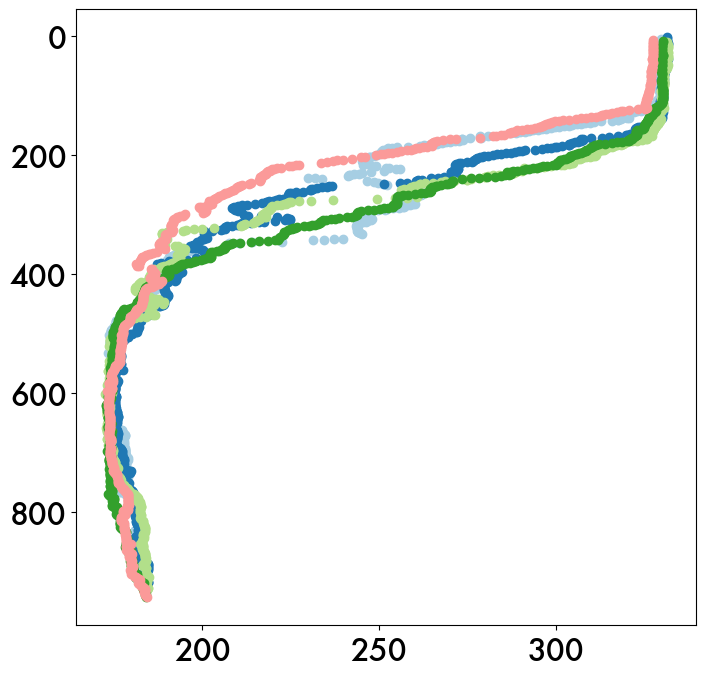

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.gca()


for prof in dfproc.list_profile_DFs(df_660)[100:200:20]:
    ax.scatter(prof.oxygen, prof.pressure)

ax.invert_yaxis()


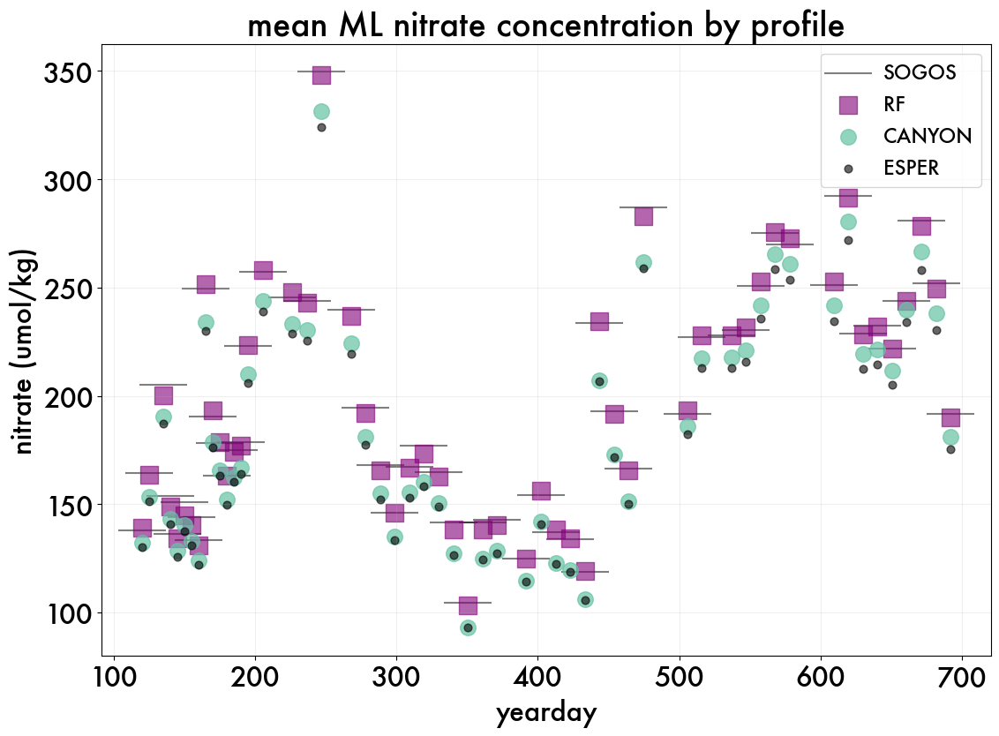

In [ ]:
fig = plt.figure(figsize=(13,9))
ax = fig.gca()

ax.scatter(profsum_6030.yearday, profsum_6030.ave_concentration, label='SOGOS', s=1500, alpha=0.5, color='k', marker='_')
ax.scatter(profsum_RF.yearday, profsum_RF.ave_concentration, label='RF', s=200, marker='s', alpha=0.6, color=model_palettes['Model_G'])
ax.scatter(profsum_CANYON.yearday, profsum_CANYON.ave_concentration, label='CANYON', s=160, alpha=0.7, color=model_palettes['Model_A'])
ax.scatter(profsum_ESPER.yearday, profsum_ESPER.ave_concentration, label='ESPER', s=40, alpha=0.6, color= 'k') # model_palettes['Model_D'])

ax.grid(alpha=0.2, zorder=1)

ax.set_ylabel('nitrate (umol/kg)')
ax.set_xlabel('yearday')

ax.set_title('mean ML nitrate concentration by profile')
ax.legend(fontsize=16)

In [ ]:
prof = dfproc.list_profile_DFs(sogos_float)[25]
len(prof)

57

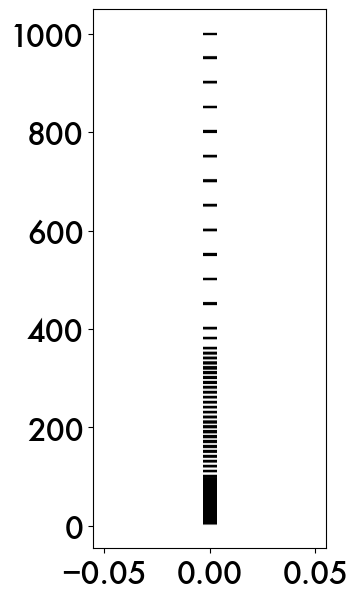

In [ ]:
fig = plt.figure(figsize=(3,7))
ax = fig.gca()

prof = dfproc.list_profile_DFs(sogos_float)[25]
y = sogos_float.pressure
x = np.tile(0, len(y))
ax.scatter(x,y, alpha=0.1, marker='_', s=100, c='k')

CANYON_pred

	file_path = '/Users/sangminsong/OneDrive - UW/Code/SOGOS/MODIS_Chl_2019/'
	files = [item for item in os.listdir(file_path)]
datasets= [xr.open_dataset(file_path + file) for file in files]

In [ ]:
modis = xr.open_dataset('../PAR_2019/Aqua.L3m_8D_2019_par_4km.nc')
modis['days'] = sg.datetime2ytd(modis.time)

In [ ]:
modis['days'] = sg.datetime2ytd(modis.time)